**Softmax and Cross-Entropy**


activation , loss

**If we apply softmax or sigmoid on output layer, we get actual probability values.**

softmax = for multi class classification

sigmoid = for binary classification

both of it produces actual probabilities of each classes and their class sum will sum up and make the total sum as 1.

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h25m04s].png](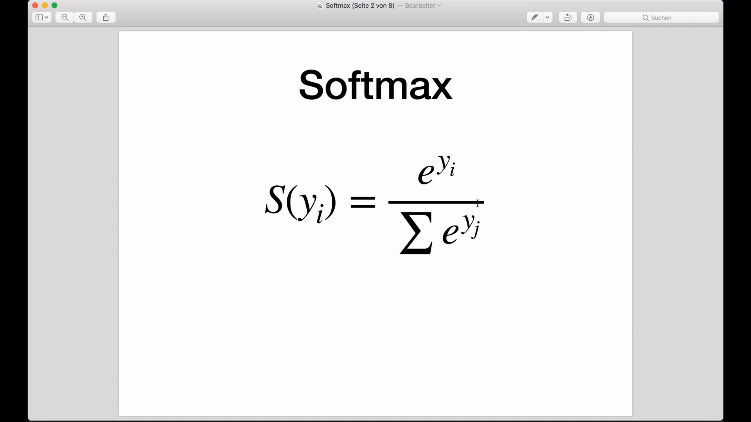)

In probability theory, an exhaustive set of events refers to a set of events that collectively cover all possible outcomes of a random experiment. In other words, if you consider all the events in the set, one of them must occur. The probability of the union of all events in an exhaustive set is equal to 1.

Formally, let E_1, E_2, ...., E_n be a set of events. This set is considered exhaustive if:

E_1 `U` E_2 `U` .... `U` E_n = `S`

where `S` is the sample space of possible outcomes.

For example, consider rolling a six-sided fair die. The set of events {1, 2, 3, 4, 5, 6} is exhaustive because one of these outcomes must occur when you roll the die. Another example could be the events {Heads, Tails} when flipping a fair coin. The set is exhaustive because either Heads or Tails will occur.

It's important to note that the events in an exhaustive set are mutually exclusive, meaning that only one of them can occur at a time. In the die example, if the outcome is 3, it cannot be 4 at the same time.


**If we have a set of events that are mutually exclusive and collectively exhaustive, the sum of the probabilities of such events is equal to 1.**

Mutually exclusive events = Mutually exclusive events are events that cannot occur simultaneously, meaning the occurrence of one event precludes the occurrence of the other.

SO NEURAL NETWORK KI OUTPUT CLASSES AS A PROBABILITIES BECAUSE OF BEING MUTUALLY EXCLUSIVE AND SUM OF PROBABILITIES TO BE 1, Are exhaustive set of events.

Yes, that's correct. In a 10-class classification problem, the set of events corresponding to each class is considered exhaustive because the neural network assigns probabilities to each class, and the sum of these probabilities across all classes is 1. Each instance (object) can only belong to one of the classes at a time, making the classes mutually exclusive. This is a fundamental concept in probability and classification, and it ensures that every possible outcome is covered, and the probabilities reflect a distribution across all possible classes.

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h25m31s].png](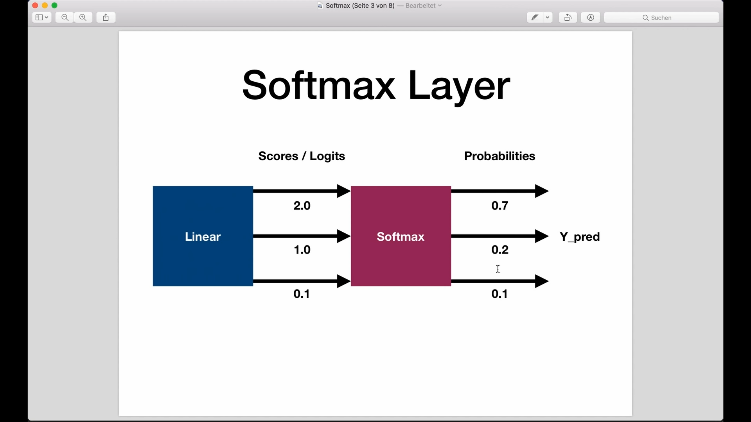)

In [ ]:
import numpy as np

def softmax(x):
  return np.exp(x)/np.sum(np.exp(x),axis=0)

x = np.array([2.0,1.0,0.1])

outputs = softmax(x)

print("softmax numpy:",outputs)


softmax numpy: [0.65900114 0.24243297 0.09856589]


In [ ]:
rounded_output = np.round(outputs, decimals=1)
print(rounded_output)

[0.7 0.2 0.1]


same as the image above.

In [ ]:
import torch

x = torch.tensor([2.0,1.0,0.1])

outputs = torch.softmax(x, dim=0)

print(outputs)

tensor([0.6590, 0.2424, 0.0986])


A lot of time softmax function is combined with cross-entropy loss

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h28m40s].png](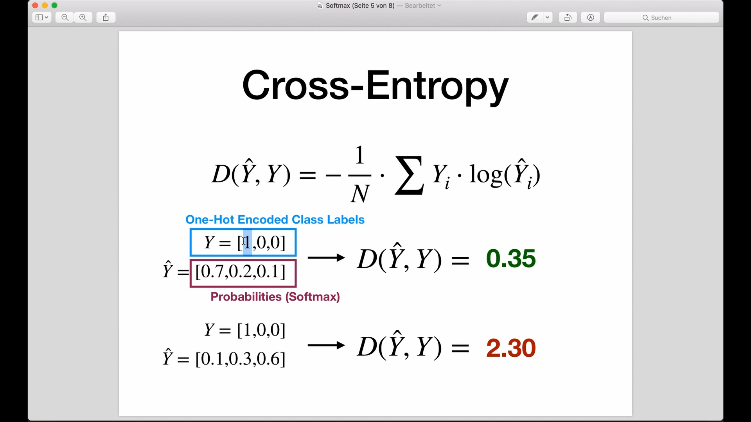)

In [ ]:
import torch
import torch.nn as nn
import numpy as np

def cross_entropy(actual, predicted):
  loss = -np.sum(actual*np.log(predicted))/len(actual)
  return loss

# y must be one hot encoded for crossentropy loss
# suppose 3 class classification problem, so
# class 0 = [1 0 0]
# class 1 = [0 1 0]
# class 2 = [0 0 1]

Y = np.array([1,0,0])

# y_pred has probabilities
y_pred_good = np.array([0.7,0.2,0.1]) # loss should be less for this
y_pred_bad = np.array([0.1,0.3,0.6]) # loss should be more for this
loss_good = cross_entropy(Y, y_pred_good)
loss_bad = cross_entropy(Y, y_pred_bad)

print("Loss in good prediction: ",loss_good)
print("Loss in bad prediction: ", loss_bad)

Loss in good prediction:  0.11889164797957748
Loss in bad prediction:  0.7675283643313485


ML/DL models always try to minimize these losses. May be the bad loss be in epoch 2 or 3, while the good loss is the result after epoch number 10 or 11. So with the increase in epochs, loss gets reduced.

In [ ]:
# upto 4 decimal only
print(f'Good loss: {loss_good:.4f}')
print(f'Bad loss: {loss_bad:.4f}')

Good loss: 0.1189
Bad loss: 0.7675


DOING THE SAME IN PYTORCH

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h31m42s].png](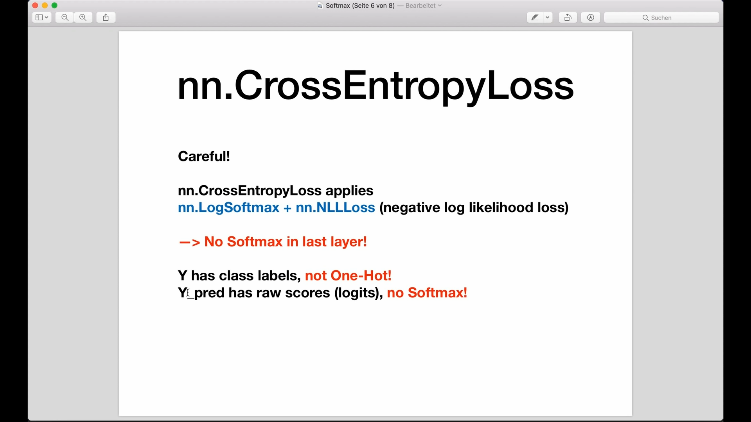)

In [ ]:
import torch
import torch.nn as nn
import numpy as np

loss = nn.CrossEntropyLoss()

# there are several assumptions while applying this directly from torch.nn module:
# 1. CrossEntropyLoss in PyTorch applies Softmax by itself, so no need to apply Softmax separately
# 2. nn.LogSoftmax + nn.NLLLoss,
# 3. NLLLoss = negative log likelihood loss
# 4. Direct class labels, no one-hot encoding required

Y = torch.tensor([0])  # not one-hot encoded anymore
# n_samples * n_classes = 1*3
y_pred_good = torch.tensor([[2.0, 1.0, 0.1]])
y_pred_bad = torch.tensor([[0.1, 0.3, 0.6]])

loss_good = loss(y_pred_good, Y)
loss_bad = loss(y_pred_bad, Y)

print(loss_good.item())  # if only has one value, call .item() function
print(loss_bad.item())


0.4170299470424652
1.3532865047454834


MSE is more commonly associated with regression problems, where the output is a continuous value. It measures the average squared difference between predicted and actual values.

BinaryCrossEntropy or CrossEntropyLoss = classification problems

In [ ]:
# getting the max probability class in both bad and good predictions , 0-based indexing
_ , prediction1 = torch.max(y_pred_good, 1) # value, index along the column of index 1
_ , prediction2 = torch.max(y_pred_bad, 1)
print(prediction1)
print(prediction2)

tensor([0])
tensor([2])


In PyTorch, when you use the `torch.max()` function with the second argument set to 1, it returns both the maximum values and their corresponding indices along the specified dimension. The underscore (`_`) is a convention used to indicate that you are not interested in the actual maximum values and only want the indices.

So, in your code:

```python
_ , prediction1 = torch.max(y_pred_good, 1)
_ , prediction2 = torch.max(y_pred_bad, 1)
```

The `prediction1` and `prediction2` variables will contain the indices (class labels) corresponding to the maximum values along the second dimension (1). These indices represent the predicted classes for each sample.

Here's a breakdown of what is happening:
- `_` is a placeholder for the values you are not using.
- `prediction1` and `prediction2` will contain the predicted classes for `y_pred_good` and `y_pred_bad`, respectively.

So, after running the code, `prediction1` and `prediction2` will be tensors containing the indices of the maximum values along the second dimension for `y_pred_good` and `y_pred_bad`, representing the predicted classes.

In [ ]:
import torch
import torch.nn as nn
import numpy as np

loss = nn.CrossEntropyLoss()

# 3 samples : cross entropy loss with multiple samples
Y = torch.tensor([2,0,1])  # not one-hot encoded anymore

# n_samples * n_classes = 1*3
y_pred_good = torch.tensor([[0.2, 1.0, 2.1], [2.0, 1.0, 0.1], [0.1, 3.0, 0.1]])
y_pred_bad = torch.tensor([[2.1, 0.3, 0.6], [0.1, 1.0, 2.1], [0.1, 0.3, 0.6]])

loss_good = loss(y_pred_good, Y)
loss_bad = loss(y_pred_bad, Y)

print(loss_good.item())  # if only has one value, call .item() function
print(loss_bad.item())

_ , prediction1 = torch.max(y_pred_good, 1)
_ , prediction2 = torch.max(y_pred_bad, 1)

print(prediction1) # this will be accurate or goot prediction of the classes of the all the 3 samples
print(prediction2) # this will be prediction with high error for the classes of all the 3 samples

0.3050403296947479
1.788500189781189
tensor([2, 0, 1])
tensor([0, 2, 2])


MULTICLASS CLASSIFICATION

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h38m31s].png](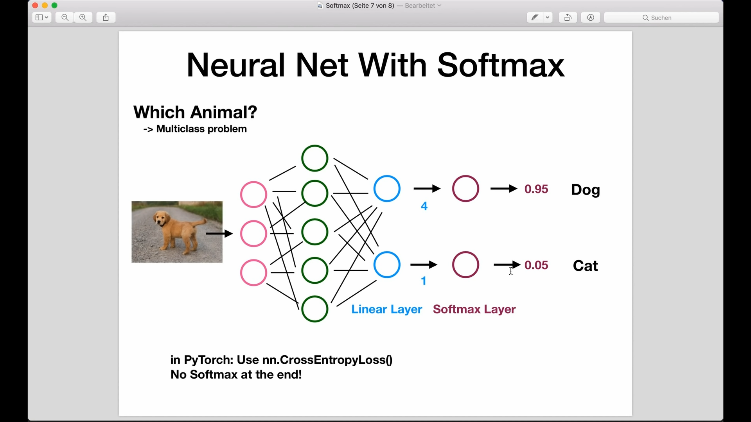)

2 OR MORE THAN 2 CLASSES = MULTICLASS CLASSIFICATION

ONLY ONE CLASS HAI TOH HI BINARY CLASSIFICATION USE HOGA.


In [ ]:
# Multiclass classification
class NeuralNet1(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(NeuralNet1, self).__init__()
        self.linear1 = nn.Linear(input_size, hidden_size) # first layer : linear
        self.relu = nn.ReLU() # second layer : relu
        self.linear2 = nn.Linear(hidden_size, 1)  # third layer : linear

    def forward(self, x):
        out = self.linear1(x)
        out = self.relu(out)
        out = self.linear2(out)
        # sigmoid at the end
        y_pred = torch.sigmoid(out)
        return y_pred

model = NeuralNet1(input_size=28*28, hidden_size=5)
criterion = nn.BCELoss()

BINARYCROSSENTROPYLOSS : FOR BINARY CLASSIFICATIONS = YES/NO KIND OF CASES.

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h41m10s].png](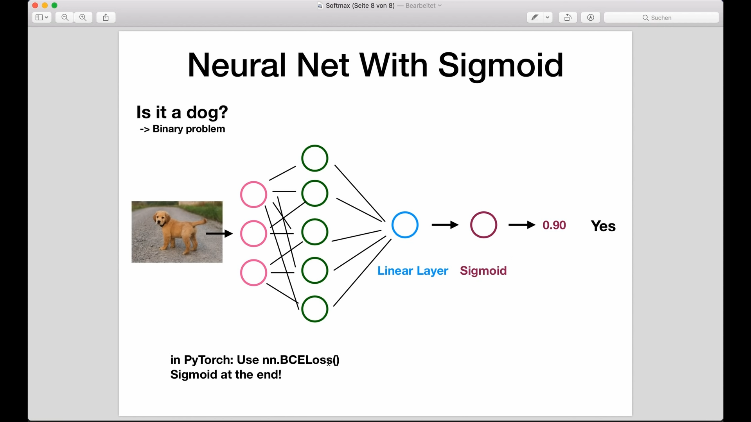)

REMEMBER BINARY CLASSIFICATION PROBLEM ME ONLY ONE CLASS HOTI HAI.

In [ ]:
import torch
import torch.nn as nn

# Binary Classification
class NeuralNet1(nn.Module):
  def __init__(self, input_size, hidden_size):
    super(NeuralNet1, self).__init__()
    self.linear1 = nn.Linear(input_size, hidden_size)
    self.relu = nn.ReLU()
    self.linear2 = nn.Linear(hidden_size, 1)

  def forward(self, x):
    out = self.linear1(x)
    out = self.relu(out)
    out = self.linear2(out)
    # sigmoid at the end
    y_pred = torch.sigmoid(out)
    return y_pred

model = NeuralNet1(input_size = 28*28, hidden_size = 5)
criterion = nn.BCELoss()

**Activation Functions**

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h43m09s].png](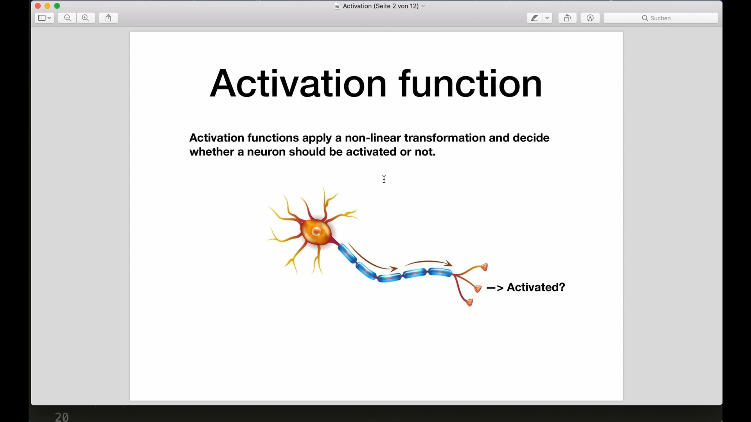)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h43m41s].png](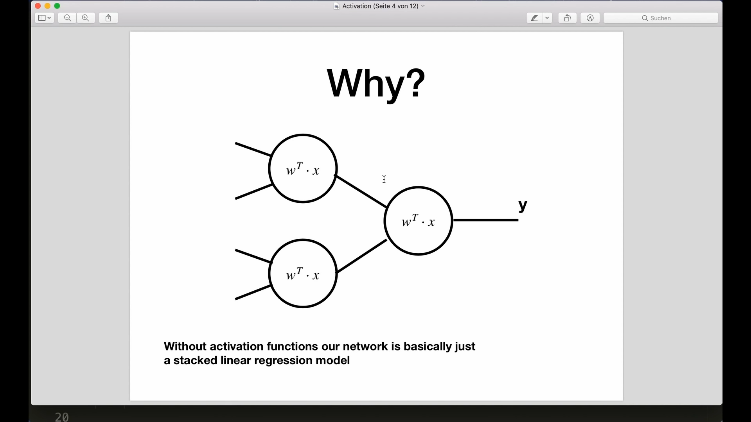)

NON-LINEAR Transformations in between can learn better and perform more complex tasks. After each layer we typically want to apply the activation functions.

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h44m20s].png](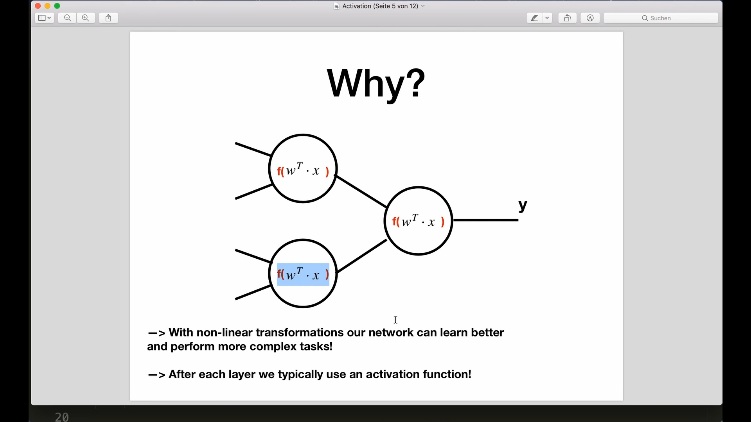)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h44m27s].png](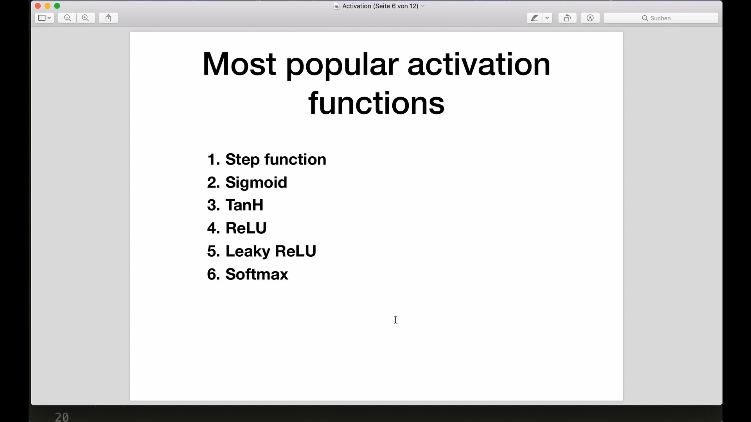)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h44m58s].png](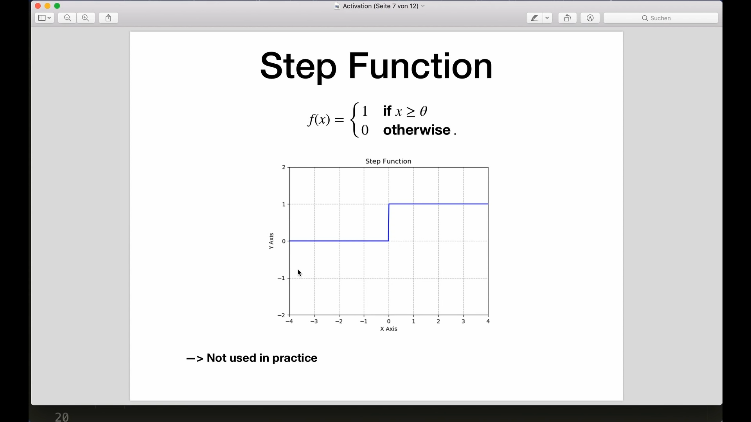)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h45m25s].png](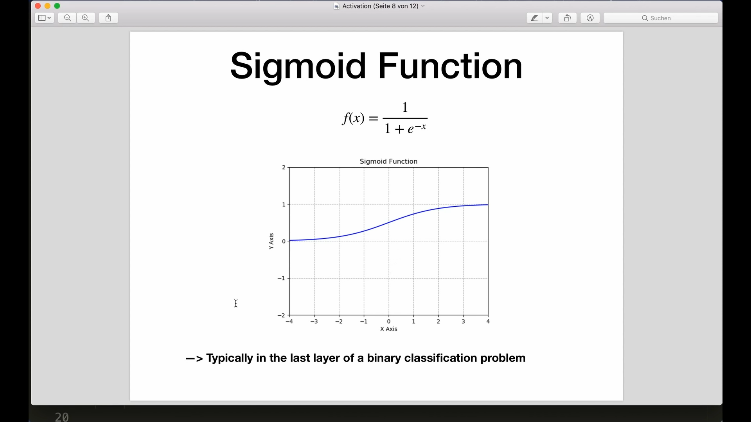)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h45m43s].png](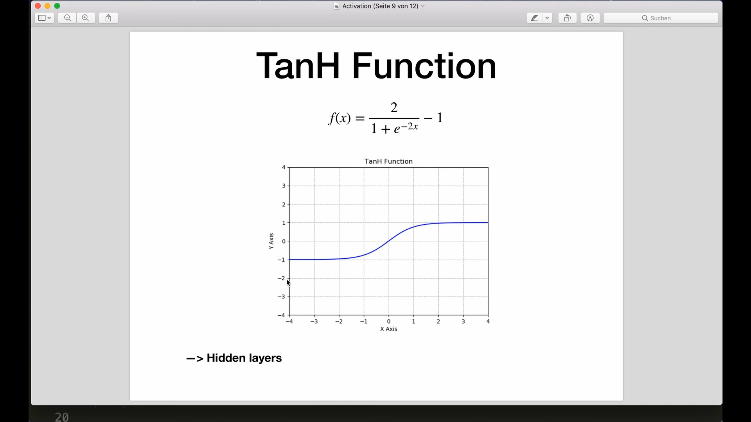)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h46m06s].png](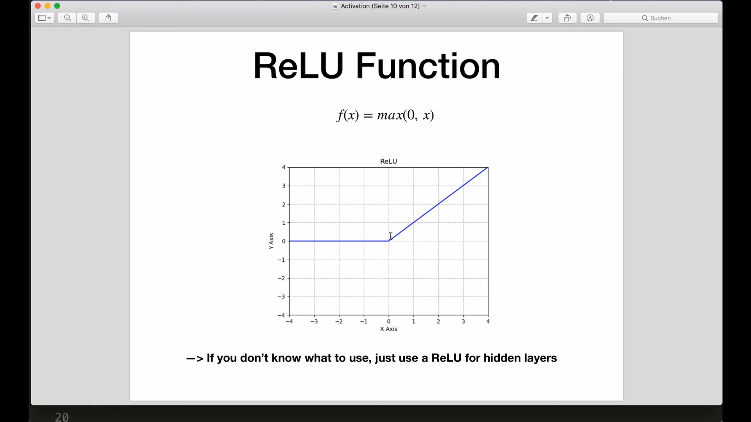)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h47m00s].png](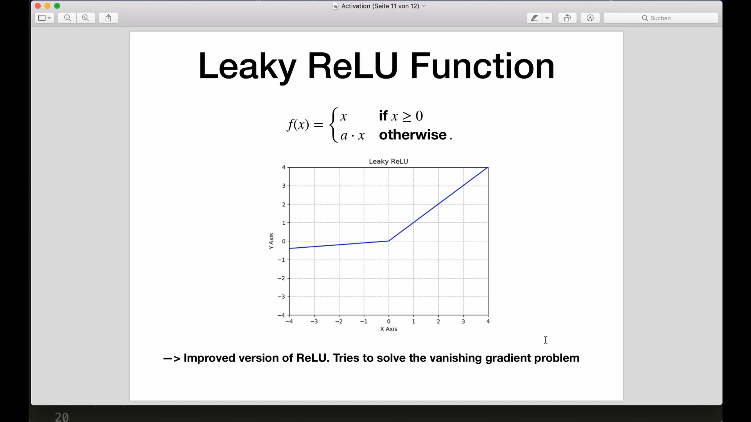)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 2h48m23s].png](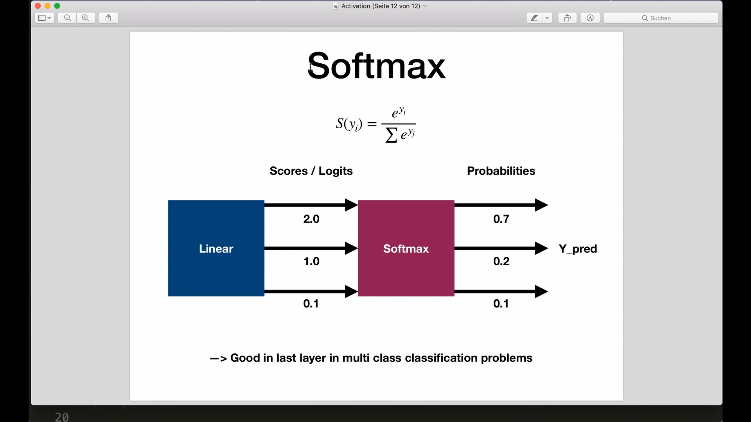)

In [ ]:
import torch
import torch.nn as nn
# import torch.nn.functional as F : havn't been used here

# Option 1 : create nn modules
class NeuralNet(nn.Module):
  def __init__(self, input_size, hidden_size):
    super(NeuralNet, self).__init__()
    self.linear1 = nn.Linear(input_size, hidden_size) # 1st linear layer
    self.relu = nn.ReLU() # first linear layer ka out we will put it into relu activation(neeche, yhan nhi)
    self.linear2 = nn.Linear(hidden_size, 1) # output of relu, we put into 2nd linear layer
    self.sigmoid = nn.Sigmoid() # 2nd linear layer ka output, we put it into sigmoid activation layer juska output will be the final output we will see

  def forward(self, x): # x=input feature
    out = self.linear1(x)
    out = self.relu(out)
    out = self.linear2(out)
    out = self.sigmoid(out)
    return out

In [ ]:
import torch
import torch.nn as nn
# import torch.nn.functional as F

# option 2 : use activation functions directly in forward pass
class NeuralNet(nn.Module):
  def __init__(self, input_size, hidden_size):
    super(NeuralNet, self).__init__()
    self.linear1 = nn.Linear(input_size, hidden_size)
    self.linear2 = nn.Linear(hidden_size, 1)

  def forward(self, x):
    out = torch.relu(self.linear1(x))
    out = torch.sigmoid(self.linear2(out))
    return out

In the provided code, there is currently no direct use of `torch.nn.functional` (imported as `F`). However, you can use `F.relu()` and `F.sigmoid()` instead of `torch.relu()` and `torch.sigmoid()`, respectively, in the `forward` method.

Here's an example of how you could modify the code to use `F.relu()` and `F.sigmoid()`:

```python
import torch
import torch.nn as nn
import torch.nn.functional as F

class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(NeuralNet, self).__init__()
        self.linear1 = nn.Linear(input_size, hidden_size)
        self.linear2 = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out = F.relu(self.linear1(x))
        out = F.sigmoid(self.linear2(out))
        return out
```

Both versions are equivalent, and you can choose either style based on your preference. The `torch.nn.functional` module (`F`) provides a functional interface for operations that don't have any parameters, such as activation functions. It's commonly used for brevity and consistency in neural network architectures.

In [ ]:
# option 3 , use torch.nn.functional as F, nn.relu() = F.relu()

import torch
import torch.nn as nn
import torch.nn.functional as F

class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(NeuralNet, self).__init__()
        self.linear1 = nn.Linear(input_size, hidden_size)
        self.linear2 = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out = F.relu(self.linear1(x))
        out = F.sigmoid(self.linear2(out))
        return out

Yes, nn.ReLU and nn.relu are essentially the same in terms of functionality. Both are correct syntaxes, and they refer to the Rectified Linear Unit (ReLU) activation function provided by PyTorch.

  def \__init__(self, input_size, hidden_size):
  
    super(NeuralNet, self).__init__()
    self.relu = nn.ReLU()
    self.sigmoid = nn.Sigmoid()
    self.softmax = nn.Softmax
    self.tanh = nn.TanH
    self.leakyrelu = nn.LeakyReLU

    they are also available in torch api as well as
    torch.softmax
    torch.relu
    torch.tanh
    torch.sigmoid

    if they are not available in torch api directly, use torch.nn.functional as F. then F.relu, F.sigmoid etc



FIRST MULTILAYER NEURAL NETWORK TO DO DIGIT CLASSIFICATION BASED ON THE FAMOUS MNIST DATASET.

torch.Size([100, 1, 28, 28]) torch.Size([100])


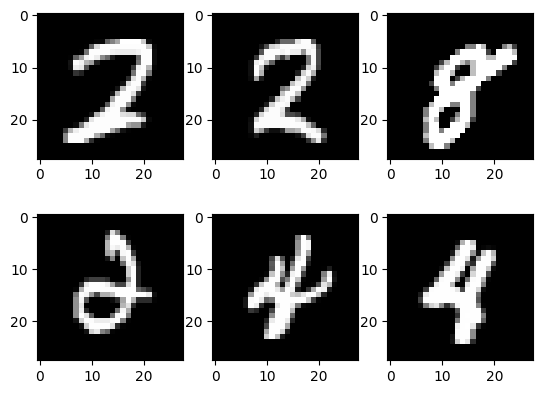

epochs 1/2, step 100/600, loss = 0.5196
epochs 1/2, step 200/600, loss = 0.2277
epochs 1/2, step 300/600, loss = 0.2676
epochs 1/2, step 400/600, loss = 0.3543
epochs 1/2, step 500/600, loss = 0.3657
epochs 1/2, step 600/600, loss = 0.1346
epochs 2/2, step 100/600, loss = 0.2138
epochs 2/2, step 200/600, loss = 0.2707
epochs 2/2, step 300/600, loss = 0.1133
epochs 2/2, step 400/600, loss = 0.1551
epochs 2/2, step 500/600, loss = 0.2949
epochs 2/2, step 600/600, loss = 0.1944
accuracy = 95.24%


In [ ]:
# the following we will do :
# MNIST
# DATALOADER, TRANSFORMATION
# MULTILAYER NEURAL NETWORK, ACTIVATION FUNCTION
# LOSS AND OPTIMIZER
# TRAINING LOOP(BATCH TRAINING)
# MODEL EVALUATION
# GPU SUPPORT

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# device config
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# hyperparameters
input_size = 784 # as 28*28 is image size
hidden_size = 100
num_classes = 10
num_epochs = 2
batch_size = 100
learning_rate = 0.001

# Import mnist dataset
train_dataset = torchvision.datasets.MNIST(root='./data_new', train=True, transform = transforms.ToTensor(), download=True)

test_dataset = torchvision.datasets.MNIST(root='./data_new', train=False, transform = transforms.ToTensor())

train_loader = torch.utils.data.DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True)

test_loader = torch.utils.data.DataLoader(dataset = test_dataset, batch_size=batch_size, shuffle = False)

examples = iter(train_loader)
# samples, labels = examples.next()
samples, labels = next(examples) # This change is due to the update in PyTorch's DataLoader

print(samples.shape, labels.shape)

for i in range(6):
  plt.subplot(2,3,i+1) # 2 rows, 3 columns
  plt.imshow(samples[i][0], cmap='gray')
plt.show()

class NeuralNet(nn.Module):
  def __init__(self, input_size, hidden_size, num_classes):
    super(NeuralNet, self).__init__()
    self.l1 = nn.Linear(input_size, hidden_size)
    self.relu = nn.ReLU()
    self.l2 = nn.Linear(hidden_size, num_classes)

  def forward(self, x): # x = sample 'x'
    out = self.l1(x)
    out = self.relu(out)
    out = self.l2(out)
    # no softmax here, as cross entropy loss, will apply softmax internally when we compute loss
    return out

model = NeuralNet(input_size, hidden_size, num_classes)

# loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)

# training loop
n_total_steps = len(train_loader)

for epochs in range(num_epochs):
  for i , (images, labels) in enumerate(train_loader):
    # 100,1,28,28
    images = images.reshape(-1, 28*28).to(device)
    labels = labels.to(device)

    # forward pass
    outputs = model(images)
    loss = criterion(outputs, labels)

    # backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if(i+1)%100 == 0:
      print(f'epochs {epochs+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.4f}')

# testing or evaluation
with torch.no_grad():
  n_correct = 0
  n_samples = 0
  for images, labels in test_loader:
    images = images.reshape(-1, 28*28).to(device)
    labels = labels.to(device)
    outputs = model(images)

    # torch.max function will return value, index
    _ , predictions = torch.max(outputs, 1)
    n_samples += labels.shape[0]
    n_correct += (predictions == labels).sum().item()

  acc = 100.0 * n_correct / n_samples
  print(f'accuracy = {acc}%')

CODE KAFI BHARI HAI, AS PYTORCH ME KAM KRNA IS NEW FOR ME. Let's try to understand with the help of chatgpt..

Sure, let's break down the code step by step:

### 1. Setup

```python
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
```
- Determines the device to use (GPU if available, otherwise CPU).

### 2. Hyperparameters

```python
input_size = 784
hidden_size = 100
num_classes = 10
num_epochs = 2
batch_size = 100
learning_rate = 0.001
```
- Defines hyperparameters for the neural network training.

### 3. Data Loading

```python
train_dataset = torchvision.datasets.MNIST(root='./data_new', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = torchvision.datasets.MNIST(root='./data_new', train=False, transform=transforms.ToTensor())

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)
```
- Loads the MNIST dataset, applies a transformation to convert images to tensors, and creates data loaders for training and testing.

### 4. Visualize Sample Images

```python
examples = iter(train_loader)
samples, labels = next(examples)

print(samples.shape, labels.shape)
```
- Retrieves a batch of training data and prints the shape of the samples and labels.
- Displays a subplot of the first 6 images in the batch.

### 5. Define Neural Network

```python
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.l1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.l2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        out = self.l1(x)
        out = self.relu(out)
        out = self.l2(out)
        return out
```
- Defines a simple neural network class with one hidden layer and ReLU activation.

### 6. Loss and Optimizer

```python
model = NeuralNet(input_size, hidden_size, num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
```
- Creates an instance of the neural network, defines CrossEntropyLoss as the loss function, and uses the Adam optimizer.

### 7. Training Loop

```python
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}')
```
- Iterates through the training dataset in batches, performs forward and backward passes, and updates the model parameters.

### 8. Model Evaluation

```python
with torch.no_grad():
    n_correct = 0
    n_samples = 0
    for images, labels in test_loader:
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)
        outputs = model(images)

        _, predictions = torch.max(outputs, 1)
        n_samples += labels.shape[0]
        n_correct += (predictions == labels).sum().item()

    accuracy = 100.0 * n_correct / n_samples
    print(f'Accuracy: {accuracy}%')
```
- Evaluates the trained model on the test dataset and calculates accuracy.

This code essentially demonstrates a complete pipeline for training a simple neural network on the MNIST dataset, including data loading, model definition, training loop, and evaluation.

MORE DETAILED EXPLANATION OF TOUGH LINES:

Certainly! Let's go through each of the mentioned lines in detail:

1. **Loading Training Dataset:**
```python
train_dataset = torchvision.datasets.MNIST(root='./data_new', train=True, transform=transforms.ToTensor(), download=True)
```
   - `train_dataset`: This variable holds the training dataset.
   - `torchvision.datasets.MNIST`: Loads the MNIST dataset.
   - `root='./data_new'`: Specifies the directory where the dataset will be downloaded.
   - `train=True`: Indicates that this is the training split of the dataset.
   - `transform=transforms.ToTensor()`: Converts the images to PyTorch tensors.
   - `download=True`: Downloads the dataset if it's not already present.

2. **Loading Test Dataset:**
```python
test_dataset = torchvision.datasets.MNIST(root='./data_new', train=False, transform=transforms.ToTensor())
```
   - Similar to the training dataset, but `train=False` indicates that this is the test split of the dataset.

3. **Creating Training DataLoader:**
```python
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
```
   - `train_loader`: DataLoader for the training dataset.
   - `torch.utils.data.DataLoader`: Creates an iterable over the dataset.
   - `dataset=train_dataset`: Specifies the dataset to use.
   - `batch_size=batch_size`: Defines the batch size for each iteration.
   - `shuffle=True`: Shuffles the dataset before each epoch to introduce randomness.

4. **Creating Test DataLoader:**
```python
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)
```
   - Similar to the training loader, but `shuffle=False` since shuffling is not necessary during evaluation.

5. **Iterating through Training DataLoader:**
```python
examples = iter(train_loader)
samples, labels = next(examples)
```
   - `iter(train_loader)`: Creates an iterator from the training loader.
   - `next(examples)`: Retrieves the next batch of data.
   - `samples`: Contains the input images in the batch.
   - `labels`: Contains the corresponding labels for the images in the batch.

6. **Training Loop:**
```python
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        # ... (rest of the loop)
```
   - Nested loops iterate through the training dataset for each epoch.
   - `images`: Batch of input images.
   - `labels`: Corresponding labels for the images.
   - Reshapes images, sends to the device, performs a forward pass through the model, computes loss, and updates model parameters.

7. **Testing/Evaluation Loop:**
```python
with torch.no_grad():
    n_correct = 0
    n_samples = 0
    for images, labels in test_loader:
        # ... (rest of the loop)
```
   - `with torch.no_grad()`: Temporarily disables gradient computation to save memory during evaluation.
   - Iterates through the test loader to evaluate the model on unseen data.
   - Computes predictions, compares with ground truth labels, and calculates the accuracy.

In [ ]:
train_dataset

Dataset MNIST
    Number of datapoints: 60000
    Root location: ./data_new
    Split: Train
    StandardTransform
Transform: ToTensor()

In [ ]:
test_dataset

Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data_new
    Split: Test
    StandardTransform
Transform: ToTensor()

In [ ]:
train_loader

In [ ]:
train_loader # responsible for providing batches of data during the training process.

In [ ]:
test_loader # is used to iterate through batches of data during the model evaluation.

Certainly! Let's break down what each of the mentioned variables is storing:

1. **`train_dataset`:**
   - This variable stores the training dataset.
   - It is an instance of the `torchvision.datasets.MNIST` class.
   - The MNIST dataset consists of images of handwritten digits along with their corresponding labels.
   - The dataset is transformed to tensors using `transforms.ToTensor()`.

2. **`test_dataset`:**
   - Similar to `train_dataset`, this variable stores the test dataset.
   - It is also an instance of the `torchvision.datasets.MNIST` class.
   - The test dataset is used to evaluate the model's performance on unseen data.

3. **`train_loader`:**
   - This variable stores the DataLoader for the training dataset.
   - It is created using `torch.utils.data.DataLoader`.
   - The DataLoader is responsible for providing batches of data during the training process.
   - It takes the `train_dataset`, specifies the batch size (`batch_size`), and shuffles the data (`shuffle=True`).

4. **`test_loader`:**
   - Similar to `train_loader`, this variable stores the DataLoader for the test dataset.
   - It is also created using `torch.utils.data.DataLoader`.
   - The test DataLoader is used to iterate through batches of data during the model evaluation.
   - Unlike the training DataLoader, it doesn't shuffle the data (`shuffle=False`).

These variables essentially encapsulate the datasets and data loaders used for training and testing the neural network. The datasets (`train_dataset` and `test_dataset`) hold the actual images and labels, while the data loaders (`train_loader` and `test_loader`) provide an efficient way to iterate through batches of data during training and evaluation.

**CNN = Convolutional Neural Network**

CIFAR-10 DATASET KA USE KARENGE.

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 3h15m34s].png](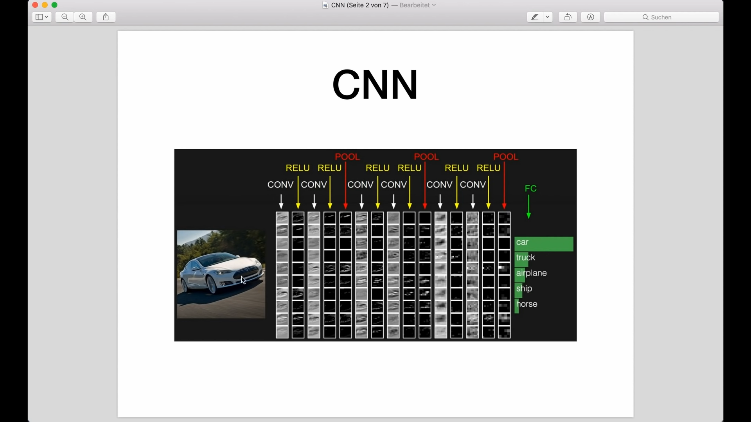)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 3h16m42s].png](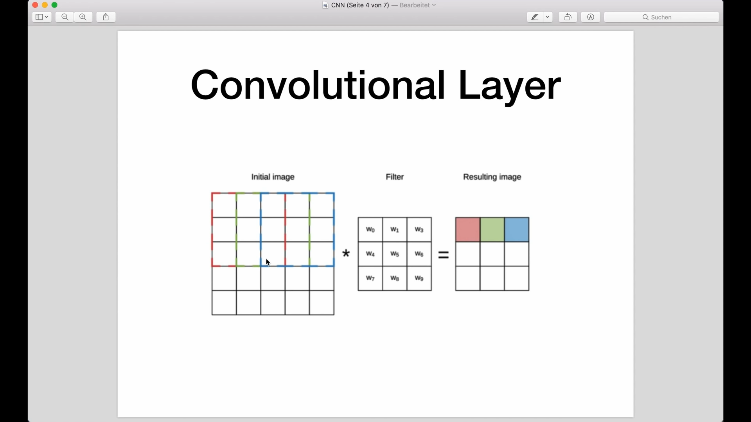)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 3h18m02s].png](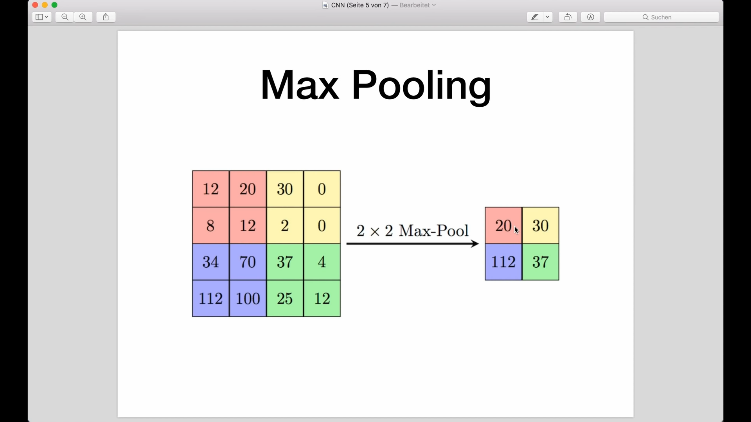)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 3h28m13s].png](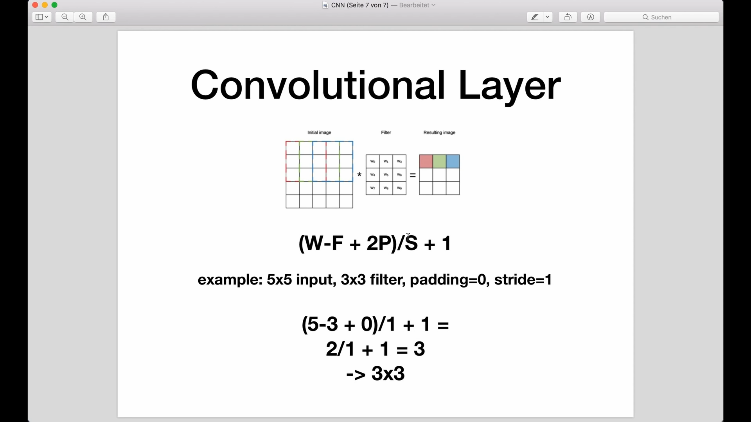)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 751x422 - 3h31m05s].png](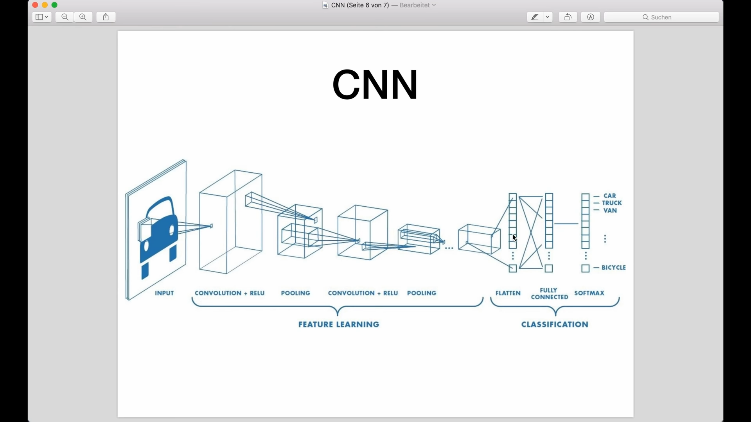)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

COMPLETE GENERAL CNN PIPELINE

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 8 # this is trial and error
batch_size = 4
learning_rate = 0.001

# dataset of PIL image has range [0, 1].
# We transform them to tensors of normalized range [-1, 1]
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

# CIFAR10: 60000 32x32 color images in 10 classes, with 6000 images per class
train_dataset = torchvision.datasets.CIFAR10(root = './data', train=True, download=True,transform = transform )
test_dataset = torchvision.datasets.CIFAR10(root='./data',train=False, download=True, transform = transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

classes = ('plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck')

class ConvNet(nn.Module):
  def __init__(self):
    super(ConvNet, self).__init__()
    self.conv1 = nn.Conv2d(3,6,5) # input channel size = 3(since rgb), output channel size = 6, kernal size = 5*5 : output image height/width = (32-5+0)/1 + 1 = 28*28 = input of next layer
    self.pool = nn.MaxPool2d(2,2) # 1st pooling layer of 2*2 = 2*2 pooling = 28/2 = 14*14 new output image size
    self.conv2 = nn.Conv2d(6,16,5) # input channels = 6(must be equal to last output channels), output channel =16, kernel size = 5*5
    # output image ki height or width = (W-F+2P)/S + 1 = (input image height - filter height + 2.padding)/stride(generally 1) + 1 = (14-5+0)/1 + 1 = 10
    self.pool = nn.MaxPool2d(2,2) # so new output image size = 10/2 = 5*5
    self.fc1 = nn.Linear(16*5*5, 120) # before passing the tensor to a fully connected layer, it needs to be flattened into 1D tensor, flattened input/tensor size = (no. of channels) * height * width = 16*5*5 : (in_features/neurons , out_features), 120 is my wish
    self.fc2 = nn.Linear(120, 84) # in features, out features(84 is by my wish, no calculations)
    self.fc3 = nn.Linear(84, 10) # infeatures, out features/classes/neurons(10)

  def forward(self, x):
    # -> n, 3, 32, 32 : 3 channels 32 * 32 image
    x = self.pool(F.relu(self.conv1(x))) # andar se bahar padho.( in sample(x) -> conv1 -> relu activation -> pool -> x)
    x = self.pool(F.relu(self.conv2(x))) # x -> conv2 -> relu activation -> pool -> output image(x)
    x = x.view(-1, 16*5*5) # flattening of image/sample x
    x = F.relu(self.fc1(x)) # x -> fc1 -> relu activation -> output
    x = F.relu(self.fc2(x)) # x ->fc2 -> relu activation -> output
    x = self.fc3(x) # no activation like softmax at the end because it is already included in CrossEntropyLoss()
    return x

model = ConvNet().to(device) # this time I will use gpu. send the model to gpu
print(f"Model device: {next(model.parameters()).device}")  # Print the device of the model's parameters
# above print line is to know whether model is working on cpu or gpu

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

n_total_steps = len(train_loader)
for epoch in range(num_epochs):
  for i, (images,labels) in enumerate(train_loader):
    # original shape : [4 3 32 32] = 4 3 1024 : 4 batch size, 3 channels for each image, 1024*1024 pixel for each images
    # input_layer = 3 input_channel, 6 output channel, 5 kernel size
    images = images.to(device)
    labels = labels.to(device)
    outputs = model(images)

    # forward pass
    optimizer.zero_grad()
    loss = criterion(outputs, labels)

    # backward and optimize
    optimizer.zero_grad() # each epochs ke bad gradients 0 krna, taki gradient accumulation se bach jayen
    loss.backward() # gradient calculator
    optimizer.step() # weights updation

    if (i+1)%5000 == 0:
      print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{n_total_steps}], Loss: {loss.item():.4f}')

print("Finished Training")
PATH = './cnn.pth'
torch.save(model.state_dict(),PATH)

with torch.no_grad():
  n_correct = 0
  n_samples = 0
  n_class_correct = [0 for i in range(10)]
  n_class_samples = [0 for i in range(10)]
  for images, labels in test_loader: # testing for 1 batch, hence images, not image
    images = images.to(device)
    labels = labels.to(device)
    outputs = model(images)
    # max returns (value, index)
    _, predicted_cls = torch.max(outputs,1)
    n_samples += labels.size(0)
    n_correct += (predicted_cls==labels).sum().item()

    for i in range(batch_size):
      label = labels[i]
      pred = predicted_cls[i]
      if (label == pred):
        n_class_correct[label]+=1
      n_class_samples[label]+=1

  acc = 100.0 * n_correct / n_samples
  print(f"Accuracy of the network: {acc} %")

  for i in range(10):
    acc = 100.0*n_class_correct[i]/n_class_samples[i]
    print(f"Accuracy of {classes[i]}: {acc} %")


Files already downloaded and verified
Files already downloaded and verified
Model device: cuda:0
Epoch [1/8], Step [5000/12500], Loss: 2.2931
Epoch [1/8], Step [10000/12500], Loss: 2.2046
Epoch [2/8], Step [5000/12500], Loss: 1.7637
Epoch [2/8], Step [10000/12500], Loss: 1.5368
Epoch [3/8], Step [5000/12500], Loss: 2.0438
Epoch [3/8], Step [10000/12500], Loss: 1.1550
Epoch [4/8], Step [5000/12500], Loss: 1.6172
Epoch [4/8], Step [10000/12500], Loss: 1.9028
Epoch [5/8], Step [5000/12500], Loss: 1.4522
Epoch [5/8], Step [10000/12500], Loss: 3.4364
Epoch [6/8], Step [5000/12500], Loss: 1.0353
Epoch [6/8], Step [10000/12500], Loss: 0.8897
Epoch [7/8], Step [5000/12500], Loss: 0.9211
Epoch [7/8], Step [10000/12500], Loss: 1.6042
Epoch [8/8], Step [5000/12500], Loss: 1.1746
Epoch [8/8], Step [10000/12500], Loss: 2.2242
Finished Training
Accuracy of the network: 55.55 %
Accuracy of plane: 59.0 %
Accuracy of car: 64.8 %
Accuracy of bird: 30.4 %
Accuracy of cat: 36.0 %
Accuracy of deer: 38.8 %


Not very good accuracy, try out more epochs.

`transform = transforms.Compose([
    transforms.ToTensor(),
    transform.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])`


The code you provided is creating a data transformation using `transforms.Compose` from the PyTorch `torchvision.transforms` module. This transformation is commonly used when working with image datasets. Let's break down what each part of this transformation does:

```python
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
```

1. **`transforms.ToTensor()`**:
   - Converts a PIL Image or NumPy array to a PyTorch tensor.
   - The pixel values of the image are scaled to the range [0, 1], if not already.

2. **`transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))`**:
   - Normalizes the tensor by subtracting the mean and dividing by the standard deviation.
   - The first tuple `(0.5, 0.5, 0.5)` represents the mean for each channel (RGB) to be subtracted.
   - The second tuple `(0.5, 0.5, 0.5)` represents the standard deviation for each channel to divide by.

In summary, this transformation is often applied to image data before feeding it into a neural network. The `ToTensor()` part converts the image data to PyTorch tensors, and the `Normalize()` part helps to center and normalize the pixel values, making them suitable for many machine learning models. The specific values used for mean and standard deviation (0.5 for each) are common choices for normalizing images in the range [-1, 1].


0.5 ISLIYE SINCE 0 TO 1 THI ORIGINAL IMAGES, 0 TO 1 KA MEAN 0.5 AND STD 0.5 HOTA HAI.

TRANSFER LEARNING IN PYTORCH

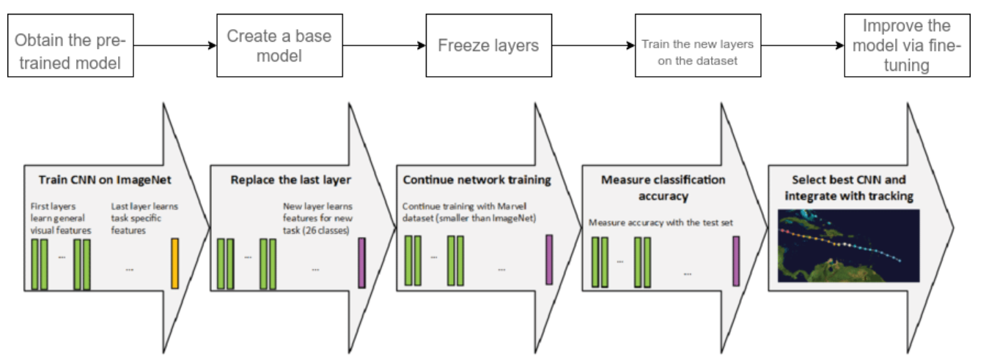!

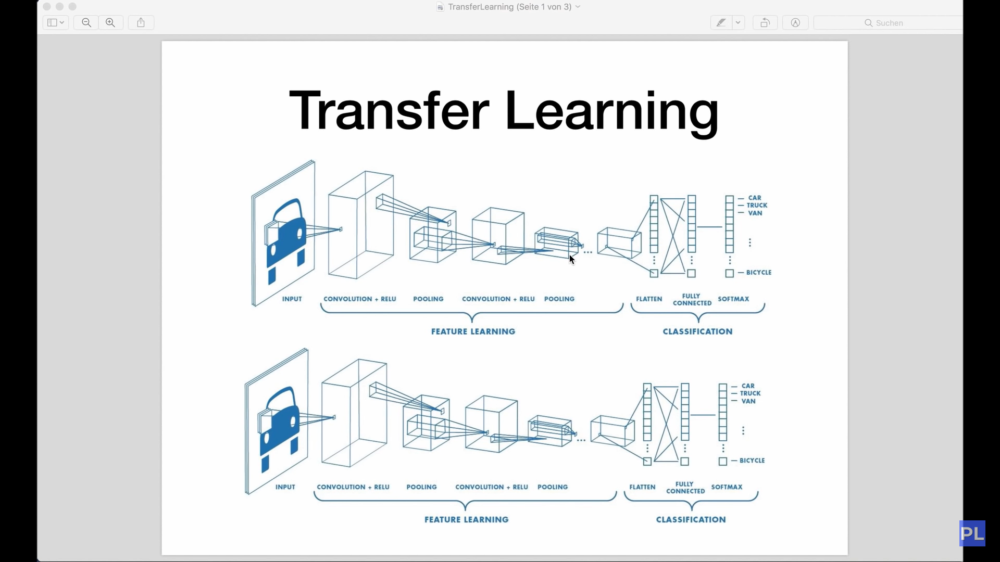

Transfer learning is a machine learning technique where a model trained on one task is adapted to perform a second related task. In the context of deep learning and neural networks, transfer learning involves using pre-trained models that have been trained on large datasets for a particular task, such as image classification, and fine-tuning them for a specific related task.

The general idea behind transfer learning is that features learned by a model on a large dataset for a specific task are often useful for other tasks. Instead of training a model from scratch for a new task, transfer learning allows us to leverage the knowledge gained by a model on a source task and apply it to a target task.

Here's a typical process of using transfer learning for classification problems:

1. **Pre-trained Model Selection:** Choose a pre-trained model that has been trained on a large dataset. Common choices include models like VGG, ResNet, Inception, or MobileNet, which are pre-trained on datasets like ImageNet.

2. **Remove Last Layers:** Remove the final classification layers of the pre-trained model. These layers are task-specific and need to be replaced for the new task.

3. **Add New Layers:** Add new layers to the pre-trained model to adapt it to the specific requirements of your task. These layers usually include a new set of fully connected layers and a final softmax layer for classification.

4. **Freeze Pre-trained Layers:** Optionally, freeze the weights of the pre-trained layers during the initial training phases. This prevents these layers from being updated, and only the newly added layers are trained.

5. **Training:** Train the modified model on your target dataset. Since you are starting with a pre-trained model, you often need fewer epochs to achieve good performance.

Transfer learning is particularly useful when you have a limited amount of data for your target task because the pre-trained model has already learned general features from a large dataset. This can help improve the performance of your model, even with a smaller amount of task-specific data.

In PyTorch, you can implement transfer learning using the `torchvision.models` module, which provides pre-trained models. You can load a pre-trained model, modify it, and then fine-tune it on your specific classification task.

Transfer learning is ML technique in which a model developed for a first task is then reused as the statring point for a model for second task.

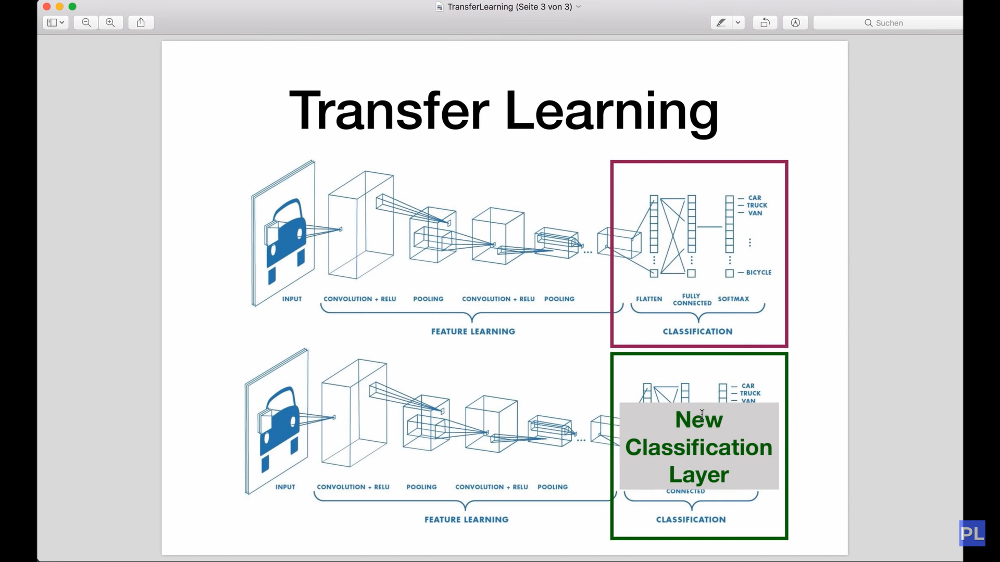

USING PRETRAINED RESNET-18 , TRAINED MORE THAN MILION DATASET OF IMAGENET DATASET. CLASSIFIES DATASETS INTO 1000 OBJECT CATEGORIES.

Then we will use this model to classify our system of 2 classes( ants ant bees). First training and then testing. They are collectively termed as hymenoptara.

Hymenoptara = a large order of insects that includes the bees, wasps, ants, and sawflies. They have four transparent wings and the females typically have a sting.

Accuracy may not be great as I have very less number of images a total of 200 for each of the two classes.

['ant', 'bee']


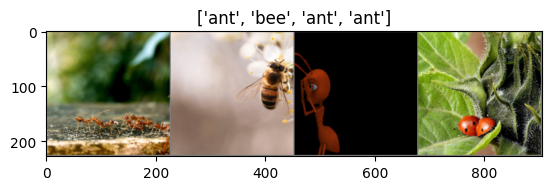

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 57.9MB/s]


Epoch 0/4
----------


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6852 Acc: 0.5528
val Loss: 0.3556 Acc: 1.0000

Epoch 1/4
----------
train Loss: 0.5377 Acc: 0.7453
val Loss: 0.2308 Acc: 1.0000

Epoch 2/4
----------
train Loss: 0.4525 Acc: 0.8076
val Loss: 0.1803 Acc: 0.9318

Epoch 3/4
----------
train Loss: 0.4192 Acc: 0.8238
val Loss: 0.1321 Acc: 0.9773

Epoch 4/4
----------
train Loss: 0.3914 Acc: 0.8509
val Loss: 0.1318 Acc: 0.9773

Training complete in 6m 9s
Best val Acc: 1.000000
Model device: cuda:0
Epoch 0/4
----------
train Loss: 0.5849 Acc: 0.7046
val Loss: 0.3920 Acc: 0.7955

Epoch 1/4
----------
train Loss: 0.5170 Acc: 0.7453
val Loss: 0.1294 Acc: 0.9545

Epoch 2/4
----------
train Loss: 0.5183 Acc: 0.8076
val Loss: 0.1361 Acc: 0.9545

Epoch 3/4
----------
train Loss: 0.4234 Acc: 0.8293
val Loss: 0.0689 Acc: 1.0000

Epoch 4/4
----------
train Loss: 0.4841 Acc: 0.7859
val Loss: 0.1543 Acc: 0.9091

Training complete in 3m 4s
Best val Acc: 1.000000


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

mean = np.array([0.5, 0.5, 0.5])
std = np.array([0.25, 0.25, 0.25])

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
}

# Add this transform to handle images with transparency, if any
# Although I am not able to find the appropriate code to do the same written above.

data_dir = '/content/drive/MyDrive/hymenoptara_data' # ants and bees ke datasets both train and val category ke, Have been donloaded from internet and saved in hymenoptara_data directory under content section.(or project directory) see below for clear ki kaise save krna hai

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=0) for x in ['train', 'val']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(class_names)


def imshow(inp, title):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.title(title)
    plt.show()


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model


#### Finetuning the convnet ####
# Load a pretrained model and reset final fully connected layer.

model = models.resnet18(weights=True) # pretrained = True has been changed to weights = True
num_ftrs = model.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.fc = nn.Linear(num_ftrs, 2)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.SGD(model.parameters(), lr=0.001)

# StepLR Decays the learning rate of each parameter group by gamma every step_size epochs
# Decay LR by a factor of 0.1 every 7 epochs
# Learning rate scheduling should be applied after optimizer’s update
# e.g., you should write your code this way:
# for epoch in range(100):
#     train(...)
#     validate(...)
#     scheduler.step()

step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model = train_model(model, criterion, optimizer, step_lr_scheduler, num_epochs=5)

print(f"Model device: {next(model.parameters()).device}") # print line is to know whether model is working on cpu or gpu

#### ConvNet as fixed feature extractor ####
# Here, we need to freeze all the network except the final layer.
# We need to set requires_grad == False to freeze the parameters so that the gradients are not computed in backward()
model_conv = torchvision.models.resnet18(weights=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

model_conv = train_model(model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=5)

validation accuracy is quite high, even higher than training because it has just 20 images for each of the two classes in validation. That's why. Don't worry if you increase the number of validation samples, they will normalize.

The `os.path.join` function is used for joining one or more path components intelligently. In the provided code:

```python
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
```

Here's what's happening: assuming data_dir = ./data

1. `os.path.join(data_dir, x)`: This function joins the directory path `data_dir` and the subdirectory `x` using the appropriate separator for the operating system. In your case, it's creating the paths './data/train' and './data/val' by joining './data' and 'train' or 'val', respectively.

2. `datasets.ImageFolder`: This is a PyTorch class from the `torchvision.datasets` module used for loading images from a folder. It assumes that the images are organized in subfolders, each representing a class. The subdirectories are expected to be the classes.

So, `os.path.join(data_dir, x)` is helping to construct the paths to the 'train' and 'val' subdirectories within the 'data' directory.

Now, regarding the error you are encountering (`FileNotFoundError`), it seems like the code is expecting to find subdirectories named 'train' and 'val' inside the 'data' directory, but they are not present. You need to make sure that you have the 'train' and 'val' subdirectories inside the 'data' directory and that they contain the training and validation images organized by class.

Ensure your project directory structure looks like this:

```
- YourProjectFolder
  - data
    - train
      - class1
        - image1.jpg
        - image2.jpg
        ...
      - class2
        - image1.jpg
        - image2.jpg
        ...
      ...
    - val
      - class1
        - image1.jpg
        - image2.jpg
        ...
      - class2
        - image1.jpg
        - image2.jpg
        ...
      ...
```

Make sure that the 'train' and 'val' folders contain the class-wise subdirectories with corresponding images.

**Let's deep dive into the above transfer learning code.**

Certainly, I'll break down the code for you step by step, explaining the purpose of each section and the use of various PyTorch functions.

### Part 1: Imports and Initial Setup

```python
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
```

- This section imports necessary libraries and modules for working with PyTorch, including neural network layers, optimization algorithms, data transformation tools, and visualization.

### Part 2: Data Transformation and Loading

```python
mean = np.array([0.5, 0.5, 0.5])
std = np.array([0.25, 0.25, 0.25])

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
}

data_dir = '/content/drive/MyDrive/hymenoptara_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=0) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes
```

- This part defines data transformations for training and validation sets using `transforms.Compose`.
- The dataset is loaded using `datasets.ImageFolder`, which assumes that each class has its own subdirectory.
- `dataloaders` are created to load the data in batches.
- `dataset_sizes` stores the size of the training and validation datasets.
- `class_names` contains the names of the classes.

### Part 3: Visualization Function

```python
def imshow(inp, title):
    inp = inp.numpy().transpose((1, 2, 0))
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.title(title)
    plt.show()

# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])
```

- This part defines a function `imshow` to visualize a batch of images and their labels.
- It retrieves a batch of training data and creates a grid of images using `torchvision.utils.make_grid`.
- The `imshow` function then displays this grid.

### Part 4: Training Function

```python
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    # ... (see next part for the rest of the function)
```

- This part defines a function `train_model` responsible for training and evaluating the model.
- It takes a pre-trained model, loss criterion, optimizer, learning rate scheduler, and the number of epochs as input.

### Part 5: Loading and Modifying the Pre-trained Model (Fine-tuning)

```python
model = models.resnet18(weights=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)
step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
model = train_model(model, criterion, optimizer, step_lr_scheduler, num_epochs=5)
```

- This part loads a pre-trained ResNet-18 model from torchvision and modifies its final fully connected layer for fine-tuning on a new task (binary classification in this case).
- The model is moved to the specified device (GPU if available).
- Cross-entropy loss and SGD optimizer are defined.
- A learning rate scheduler is created.
- The `train_model` function is called to train the model.

### Part 6: Freezing Convolutional Layers

```python
model_conv = torchvision.models.resnet18(weights=True)
for param in model_conv.parameters():
    param.requires_grad = False

num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)
model_conv = model_conv.to(device)
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)
model_conv = train_model(model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=5)
```

- This part loads the ResNet-18 model and freezes its convolutional layers by setting `requires_grad` to False for each parameter.
- The final fully connected layer is modified for the binary classification task.
- The model is moved to the specified device.
- A new optimizer is defined only for the parameters of the final layer.
- The learning rate scheduler and training loop are the same as before.

### Summary:

The code demonstrates transfer learning with a pre-trained ResNet-18 model on a binary classification task. It covers data loading, visualization, model modification, and training. Fine-tuning is performed by updating all parameters initially and then freezing convolutional layers while training only the fully connected layer. This is a common practice to leverage pre-trained features while adapting to a new task.

**Deep dive into each part now**

Certainly! Let's go through each part of the code in more detail:

### Part 1: Imports and Initial Setup

```python
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
```

- **Imports:** The code starts by importing various libraries and modules from PyTorch, including tools for working with neural networks (`torch.nn`), optimization algorithms (`torch.optim`), a learning rate scheduler (`lr_scheduler`), NumPy (`numpy`), torchvision for computer vision tasks (`torchvision`), and other utility modules.

- **Setup:** This section sets up the necessary components for the script, such as importing required libraries and defining common functions and classes.

### Part 2: Data Transformation and Loading

```python
mean = np.array([0.5, 0.5, 0.5])
std = np.array([0.25, 0.25, 0.25])

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
}

data_dir = '/content/drive/MyDrive/hymenoptara_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=0) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes
```

- **Data Transformations:** `data_transforms` is a dictionary that defines the transformations to be applied to the training and validation datasets. These transformations include resizing, cropping, flipping, converting to a PyTorch tensor, and normalization.

- **Dataset Loading:** `image_datasets` is a dictionary containing training and validation datasets created using `datasets.ImageFolder`. It assumes that images are organized in subdirectories, each corresponding to a class.

- **Data Loaders:** `dataloaders` is a dictionary containing PyTorch `DataLoader` objects for training and validation datasets. These loaders provide batches of data to the model during training.

- **Dataset Sizes and Class Names:** `dataset_sizes` stores the number of samples in the training and validation datasets. `class_names` contains the names of the classes, extracted from the training dataset.

### Part 3: Visualization Function

```python
def imshow(inp, title):
    inp = inp.numpy().transpose((1, 2, 0))
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.title(title)
    plt.show()

# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])
```

- **Image Visualization Function:** `imshow` is a function for visualizing a batch of images. It takes the batch (`inp`) and its corresponding titles (`title`) as input and displays the images using Matplotlib.

- **Batch Retrieval and Visualization:** A batch of training data is retrieved using `next(iter(dataloaders['train']))`. This batch is then visualized using the `imshow` function, where images are arranged in a grid using `torchvision.utils.make_grid`.

### Part 4: Training Function

```python
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    model.load_state_dict(best_model_wts)
    return model
```

- **Training Function:** `train_model` is a function responsible for training and evaluating the model. It takes a pre-trained model, loss criterion, optimizer, learning rate scheduler, and the number of epochs as input.

- **Training Loop:** The function includes a loop over the specified number of epochs. Within each epoch, it iterates over the training and validation phases, adjusting the model's weights based on the loss and updating the learning rate.

- **Epoch Statistics:** It calculates and prints the loss and accuracy for each epoch and phase.

- **Best Model Tracking:** The function keeps track of the best model based on validation accuracy and deep copies its weights.

### Part 5: Loading and Modifying the Pre-trained Model (Fine-tuning)

```python
model = models.resnet18(weights=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)
step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
model = train_model(model, criterion, optimizer, step_lr_scheduler, num_epochs=5)
```

- **Loading Pre-trained Model:** This part loads a pre-trained ResNet-18 model using `models.resnet18(weights=True)`.

- **Modifying Fully Connected Layer:** It modifies the fully connected layer of the model for the specific task (binary classification in this case). The number of input features (`num_ftrs`) is adjusted accordingly

.

- **Model Transfer to Device:** The model is transferred to the specified device (GPU if available).

- **Loss and Optimizer Definition:** Cross-entropy loss and Stochastic Gradient Descent (SGD) optimizer are defined.

- **Learning Rate Scheduler:** A step-based learning rate scheduler is created.

- **Training the Model:** The `train_model` function is called to train the model.

### Part 6: Freezing Convolutional Layers

```python
model_conv = torchvision.models.resnet18(weights=True)
for param in model_conv.parameters():
    param.requires_grad = False

num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)
model_conv = model_conv.to(device)
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)
model_conv = train_model(model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=5)
```

- **Loading Pre-trained Model with Frozen Convolutional Layers:** This part loads a pre-trained ResNet-18 model (`model_conv`) and freezes its convolutional layers by setting `requires_grad` to `False` for each parameter.

- **Modifying Fully Connected Layer:** Similar to the previous section, the fully connected layer is modified for the specific task.

- **Model Transfer to Device:** The model is transferred to the specified device (GPU if available).

- **Optimizer for Modified Layers:** A new optimizer is defined only for the parameters of the final layer to prevent updating the frozen convolutional layers.

- **Training the Model:** The `train_model` function is called to train the model.

### Summary:

Each part of the code serves a specific purpose, including data preparation, model loading and modification, training, and evaluation. The explanations provided aim to clarify the role and functionality of each line in these sections.

**10 points or lines are still left. Let'smake them crystal clear now.**

Certainly, let's go through each of the points you mentioned:

### 1. Why these 3 modules are imported: `import time`, `import os`, `import copy`

- `time`: The `time` module is imported to measure the training time. It is used to calculate the elapsed time during model training. The `time.time()` function is used to get the current time.

- `os`: The `os` module provides a way to interact with the operating system. In this script, it's used to join paths and create directories. Specifically, `os.path.join()` is used to join the `data_dir` and `x` (which represents 'train' or 'val') to create the path to the training or validation dataset.

- `copy`: The `copy` module provides a method, `deepcopy`, that is used to create a deep copy of an object. In the script, `copy.deepcopy` is used to create a deep copy of the model's state dictionary. This is typically done to save the best model's parameters during training.

### 2. `transforms.Normalize(mean, std)`

- `transforms.Normalize` is used to normalize the image data. Normalization is a common preprocessing step in machine learning that scales the pixel values to have zero mean and unit variance. The formula used is:
  ```
  output[channel] = (input[channel] - mean[channel]) / std[channel]
  ```
  where `mean` and `std` are the specified mean and standard deviation for each channel. In this case:
  ```python
  mean = np.array([0.5, 0.5, 0.5])
  std = np.array([0.25, 0.25, 0.25])
  ```
  This means that for each channel, the mean is subtracted, and the result is divided by the standard deviation.

### 3. `image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}`

- This line creates a dictionary `image_datasets` where the keys are 'train' and 'val'. For each key, it uses `datasets.ImageFolder` from torchvision to create a dataset. `os.path.join(data_dir, x)` creates the path to the dataset directory ('train' or 'val'). The corresponding data transformations (`data_transforms[x]`) are applied to each dataset.

### 4. `inp = inp.numpy().transpose((1, 2, 0))`

- This line is transforming the image tensor `inp` from PyTorch format (channels, height, width) to a format suitable for displaying using Matplotlib (height, width, channels). It uses `numpy()` to convert the PyTorch tensor to a NumPy array and then `transpose((1, 2, 0))` to change the order of the axes.

### 5. `inp = np.clip(inp, 0, 1)`

- `np.clip` is a NumPy function used to limit the values in an array. In this case, it is used to ensure that pixel values in the image are between 0 and 1. Any values less than 0 are set to 0, and any values greater than 1 are set to 1.

### 6. `inputs, classes = next(iter(dataloaders['train']))` and `out = torchvision.utils.make_grid(inputs)`

- `next(iter(dataloaders['train']))` gets the next batch of data from the training data loader. It returns a tuple `(inputs, classes)` where `inputs` are the input images and `classes` are the corresponding labels.

- `torchvision.utils.make_grid(inputs)` takes a grid of images (in this case, the input batch) and arranges them in a single grid. This is useful for visualization purposes.

### 7. `best_model_wts = copy.deepcopy(model.state_dict())`

- `copy.deepcopy()` is used to create a deep copy of the model's state dictionary (`model.state_dict()`). The state dictionary contains the parameters of the model. `best_model_wts` is used to keep a copy of the best model's parameters during training.

### 8. `'Epoch {}/{}'.format(epoch, num_epochs - 1)`

- `'{}/{}'.format(epoch, num_epochs - 1)` is a string formatting method. It is used to create a string representation of the current epoch and the total number of epochs. For example, if `epoch` is 2 and `num_epochs` is 10, it would produce the string `'Epoch 2/9'`.

### 9. `best_model_wts = copy.deepcopy(model.state_dict())`

- This line is the same as point 7 and is repeated here for clarity. It deep-copies the state dictionary of the model to `best_model_wts` to keep track of the best model parameters.

### 10. `model.load_state_dict(best_model_wts)`, `return model`

- `model.load_state_dict(best_model_wts)` loads the best model's parameters back into the model. This is done at the end of training to use the best model on validation data.

- `return model` returns the trained model from the `train_model` function.

I hope these explanations help clarify the use of each line in the script!

**TENSORBOARD : VISUALIZE AND ANALYZE THE TRAINING PIPELINE**

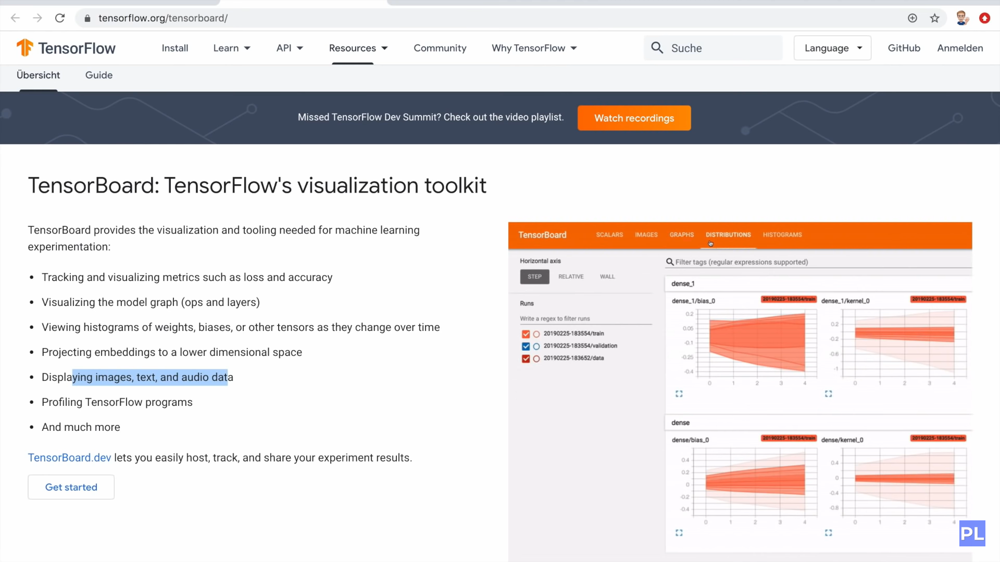

USING OUR MNIST MODEL FOR ANAZING ON TENSORBOARD.

100%|██████████| 9912422/9912422 [00:00<00:00, 183763298.55it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 63124384.48it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 49199964.41it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 3583620.91it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw

Epoch [1/1], Step [100/938], Loss: 0.5315
Epoch [1/1], Step [200/938], Loss: 0.2008
Epoch [1/1], Step [300/938], Loss: 0.3425
Epoch [1/1], Step [400/938], Loss: 0.1321
Epoch [1/1], Step [500/938], Loss: 0.1119
Epoch [1/1], Step [600/938], Loss: 0.1975
Epoch [1/1], Step [700/938], Loss: 0.0316
Epoch [1/1], Step [800/938], Loss: 0.1732
Epoch [1/1], Step [900/938], Loss: 0.1509
Accuracy of the network on the 10000 test images: 95.95 %


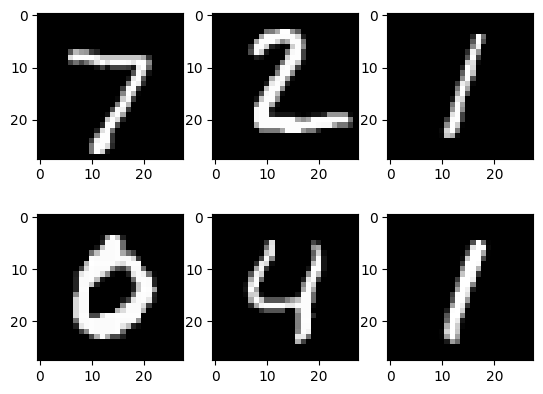

In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

############## TENSORBOARD ########################
import sys # beech se program se bahar niklene ka tarika
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/mnist1')
###################################################

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
input_size = 784 # 28x28
hidden_size = 500
num_classes = 10
num_epochs = 1
batch_size = 64
learning_rate = 0.001

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

examples = iter(test_loader)
example_data, example_targets = next(examples)

for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(example_data[i][0], cmap='gray')
#plt.show()

############## TENSORBOARD ########################
img_grid = torchvision.utils.make_grid(example_data)
writer.add_image('mnist_images', img_grid)
#writer.close() # all the writers close
#sys.exit() # beech se program se bahar niklene ka tarika
###################################################

# Fully connected neural network with one hidden layer
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.input_size = input_size
        self.l1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.l2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        out = self.l1(x)
        out = self.relu(out)
        out = self.l2(out)
        # no activation and no softmax at the end
        return out

model = NeuralNet(input_size, hidden_size, num_classes).to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

############## TENSORBOARD ########################
writer.add_graph(model, example_data.reshape(-1, 28*28).to(device))
#writer.close()
#sys.exit()
###################################################

# Train the model
running_loss = 0.0
running_correct = 0
n_total_steps = len(train_loader)
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        # origin shape: [100, 1, 28, 28]
        # resized: [100, 784]
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        running_correct += (predicted == labels).sum().item()
        if (i+1) % 100 == 0:
            print (f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{n_total_steps}], Loss: {loss.item():.4f}')
            ############## TENSORBOARD ########################
            writer.add_scalar('training loss', running_loss / 100, epoch * n_total_steps + i)
            running_accuracy = running_correct / 100 / predicted.size(0)
            writer.add_scalar('accuracy', running_accuracy, epoch * n_total_steps + i)
            running_correct = 0
            running_loss = 0.0
            ###################################################

# Test the model
# In test phase, we don't need to compute gradients (for memory efficiency)
class_labels = []
class_preds = []
with torch.no_grad():
    n_correct = 0
    n_samples = 0
    for images, labels in test_loader:
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)
        outputs = model(images)
        # max returns (value ,index)
        values, predicted = torch.max(outputs.data, 1)
        n_samples += labels.size(0)
        n_correct += (predicted == labels).sum().item()

        class_probs_batch = [F.softmax(output, dim=0) for output in outputs]

        class_preds.append(class_probs_batch)
        class_labels.append(labels)

    # 10000, 10, and 10000, 1
    # stack concatenates tensors along a new dimension
    # cat concatenates tensors in the given dimension
    class_preds = torch.cat([torch.stack(batch) for batch in class_preds])
    class_labels = torch.cat(class_labels)

    acc = 100.0 * n_correct / n_samples
    print(f'Accuracy of the network on the 10000 test images: {acc} %')

    ############## TENSORBOARD ########################
    classes = range(10)
    for i in classes:
        labels_i = class_labels == i
        preds_i = class_preds[:, i]
        writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)
        writer.close()
    ###################################################

# pytorch tensorboard --logdir=runs # it will start tensorflow at localhost, but command terminal pr, not like this
# vs code me code likhne se chalega

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 750x422 - 3h58m22s].png](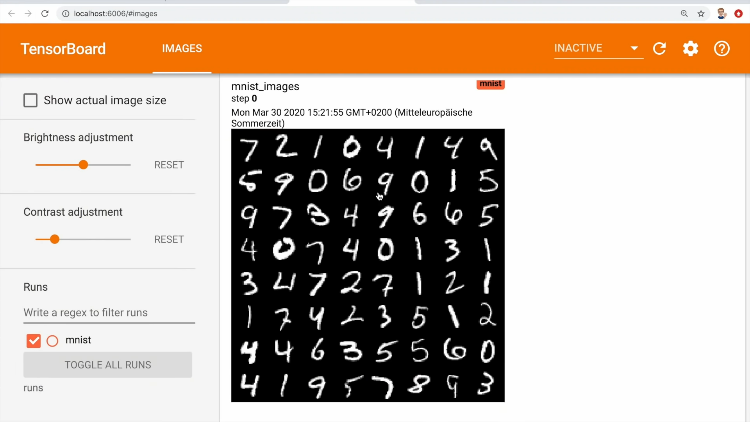)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 750x422 - 4h00m14s].png](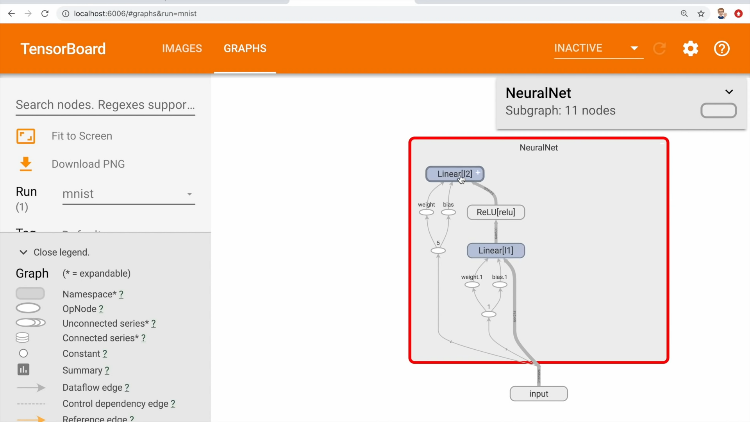)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 750x422 - 4h06m04s].png](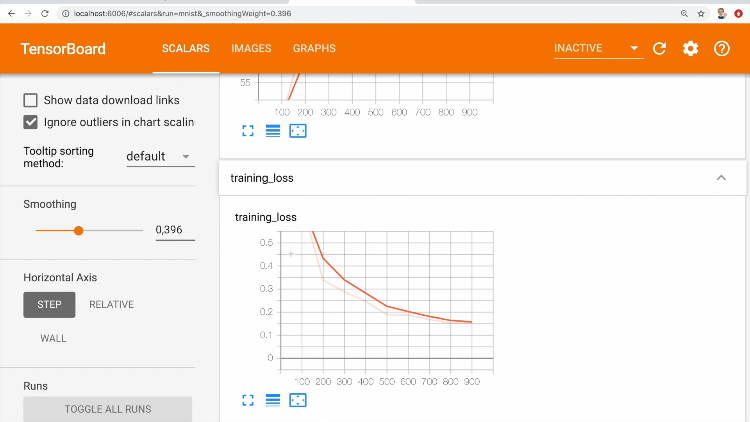)

![Patrick Loeber - Deep Learning With PyTorch - Full Course [c36lUUr864M - 750x422 - 4h16m55s].png](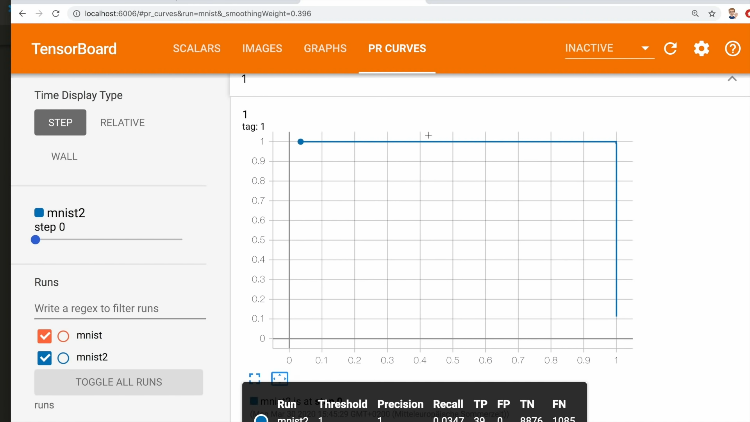)

GOT THE WAY TO OPEN TENSORBOARD IN GOOGLE COLAB...
1. Install TensorBoard if you haven't already (you only need to do this once):
2. Load the TensorBoard extension: **%load_ext tensorboard**
3. Run TensorBoard with the %tensorboard magic command. Specify the log directory where your TensorBoard logs are stored. In your case, it's the "runs/mnist1" directory: **%tensorboard --logdir runs/mnist1**


In [ ]:
!pip install tensorboard


In [ ]:
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir runs/mnist1


Output hidden; open in https://colab.research.google.com to view.

**Deep Dive into Code**

Certainly! Let's go through your code line by line:

```python
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

############## TENSORBOARD ########################
import sys
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/mnist1')
###################################################
```

- The code imports necessary modules, including PyTorch, torchvision, and Matplotlib. The key addition is the TensorBoard-related imports. `SummaryWriter` from `torch.utils.tensorboard` is used to write entries to the TensorBoard log.

```python
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
```

- It checks if a GPU is available and assigns the device accordingly.

```python
input_size = 784
hidden_size = 500
num_classes = 10
num_epochs = 1
batch_size = 64
learning_rate = 0.001
```

- Hyperparameters are defined for the neural network, such as input size, hidden layer size, number of classes, training epochs, batch size, and learning rate.

```python
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, transform=transforms.ToTensor())
```

- MNIST datasets are loaded for training and testing, using the torchvision library.

```python
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)
```

- Data loaders are created to load batches of training and test data.

```python
examples = iter(test_loader)
example_data, example_targets = next(examples)

for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(example_data[i][0], cmap='gray')
```

- A subset of the test data is visualized using Matplotlib.

```python
############## TENSORBOARD ########################
img_grid = torchvision.utils.make_grid(example_data)
writer.add_image('mnist_images', img_grid)
#writer.close() # all the writers close
#sys.exit() # beech se program se bahar niklene ka tarika
###################################################
```

- The test data images are converted into a grid using `torchvision.utils.make_grid` and added to TensorBoard with the tag 'mnist_images'.

```python
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.input_size = input_size
        self.l1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.l2 = nn.Linear(hidden_size, num_classes)  
    
    def forward(self, x):
        out = self.l1(x)
        out = self.relu(out)
        out = self.l2(out)
        return out
```

- Definition of a simple neural network class with one hidden layer.

```python
model = NeuralNet(input_size, hidden_size, num_classes).to(device)
```

- An instance of the neural network model is created and moved to the specified device (GPU or CPU).

```python
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  
```

- Loss function (cross-entropy) and optimizer (Adam) are defined.

```python
############## TENSORBOARD ########################
writer.add_graph(model, example_data.reshape(-1, 28*28).to(device))
#writer.close()
#sys.exit()
###################################################
```

- The computation graph of the model is added to TensorBoard.

```python
running_loss = 0.0
running_correct = 0
n_total_steps = len(train_loader)
```

- Variables for tracking loss and correct predictions during training are initialized.

```python
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):  
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        running_correct += (predicted == labels).sum().item()

        if (i+1) % 100 == 0:
            print (f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{n_total_steps}], Loss: {loss.item():.4f}')
            ############## TENSORBOARD ########################
            writer.add_scalar('training loss', running_loss / 100, epoch * n_total_steps + i)
            running_accuracy = running_correct / 100 / predicted.size(0)
            writer.add_scalar('accuracy', running_accuracy, epoch * n_total_steps + i)
            running_correct = 0
            running_loss = 0.0
            ###################################################
```

- Training loop where the model is trained on MNIST data. Loss and accuracy are tracked and written to TensorBoard.

```python
# Test the model
class_labels = []
class_preds = []

with torch.no_grad():
    n_correct = 0
    n_samples = 0

    for images, labels in test_loader:
        images = images.reshape(-1, 28*28).to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        values, predicted = torch.max(outputs.data, 1)
        n_samples += labels.size(0)
        n_correct += (predicted == labels).sum().item()

        class_probs_batch = [F.softmax(output, dim=0) for output in outputs]

        class_preds.append(class_probs_batch)
        class_labels.append(labels)

    class_preds = torch.cat([torch.stack(batch) for batch in class_preds])
    class_labels = torch.cat(class_labels)

    acc = 100.0 * n_correct / n_samples
    print(f'Accuracy of the network on the 10000 test images: {acc} %')

    ############## TENSORBOARD ########################
    classes = range(10)
    for i in classes:
        labels_i = class_labels == i
        preds_i = class_preds[:, i]
        writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)
        writer.close()
    ###################################################
```

- The trained model is tested on the test dataset, and accuracy is calculated. Precision-recall curves for each class are added to TensorBoard.

```python
# pytorch tensorboard --logdir=runs # it will start tensorflow at localhost
# vs code me code likhne se chalega
```

- The comment provides a command to launch TensorBoard using the logs generated during training. If you are using VS Code, the code can be run directly in the editor.

The code is designed for training a simple neural network on the MNIST dataset and visualizing the training progress and model performance using TensorBoard. It demonstrates the integration of PyTorch with TensorBoard for better monitoring and analysis of neural network training.

**More deep dive in some tensorboard specific codes that are not clear.**

Certainly! Let's go through each of the TensorBoard-specific lines and explain their purpose:

### 1. Image Grid Visualization
```python
img_grid = torchvision.utils.make_grid(example_data)
writer.add_image('mnist_images', img_grid)
writer.close()
sys.exit()
```
- `torchvision.utils.make_grid(example_data)`: This function creates a grid of images from the `example_data` tensor. It's useful for visualizing a grid of images in TensorBoard.
  
- `writer.add_image('mnist_images', img_grid)`: This line adds the image grid to TensorBoard with the tag 'mnist_images'. The tag is used to organize and identify different visualizations.

- `writer.close()`: This closes the TensorBoard writer. It's generally good practice to close the writer after adding all the required data.

- `sys.exit()`: This line forcefully exits the program. It's an unusual practice and may not be necessary. It terminates the script after adding the image grid to TensorBoard.

### 2. Adding Computation Graph
```python
writer.add_graph(model, example_data.reshape(-1, 28*28).to(device))
writer.close()
sys.exit()
```
- `writer.add_graph(model, example_data.reshape(-1, 28*28).to(device))`: This line adds the computation graph of the neural network model to TensorBoard. It visualizes how data flows through the network during forward pass.

- `writer.close()`: Closes the TensorBoard writer after adding the computation graph.

- `sys.exit()`: Similar to the previous case, it forcefully exits the program. It might be used for quick testing or debugging purposes.

### 3. Adding Scalars (Loss and Accuracy)
```python
writer.add_scalar('training loss', running_loss / 100, epoch * n_total_steps + i)
running_accuracy = running_correct / 100 / predicted.size(0)
writer.add_scalar('accuracy', running_accuracy, epoch * n_total_steps + i)
running_correct = 0
running_loss = 0.0
```
- `writer.add_scalar('training loss', running_loss / 100, epoch * n_total_steps + i)`: This adds a scalar value (training loss) to TensorBoard. It helps in visualizing the training loss over time. `running_loss / 100` is the average loss over the last 100 batches.

- `running_accuracy = running_correct / 100 / predicted.size(0)`: Calculates the running accuracy over the last 100 batches.

- `writer.add_scalar('accuracy', running_accuracy, epoch * n_total_steps + i)`: Adds the running accuracy to TensorBoard.

- `running_correct = 0` and `running_loss = 0.0`: Resets the running correct predictions and loss to zero after adding them to TensorBoard.

### 4. Precision-Recall Curves
```python
classes = range(10)
for i in classes:
    labels_i = class_labels == i
    preds_i = class_preds[:, i]
    writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)
writer.close()
```
- `classes = range(10)`: Creates a range of class indices (0 to 9 in this case, corresponding to digits 0 to 9).

- The following loop adds precision-recall curves for each class to TensorBoard:
  - `labels_i = class_labels == i`: Creates a binary tensor indicating whether the true class labels are equal to the current class `i`.
  
  - `preds_i = class_preds[:, i]`: Extracts the predicted probabilities for the current class `i`.

  - `writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)`: Adds the precision-recall curve for the current class to TensorBoard. The `str(i)` is used as a unique identifier for each class.

- `writer.close()`: Closes the TensorBoard writer after adding the precision-recall curves.

These lines demonstrate how to use TensorBoard to visualize images, computation graphs, scalars (like loss and accuracy), and precision-recall curves during training and testing of a neural network.



**Kuch aur bali ke bakre points han jo smjh nhi aa rhe..**
Certainly! Let's dive deeper into the mechanisms of each of the mentioned lines:

### 1. `writer.add_graph(model, example_data.reshape(-1, 28*28).to(device))`:
This line adds the computation graph of the neural network model to TensorBoard.

- `model`: This is the neural network model for which you want to visualize the computation graph.

- `example_data.reshape(-1, 28*28).to(device)`: This is a flattened version of the input data (`example_data`) reshaped to match the expected input size of the model (28x28 images flattened to a vector of size 784). It is also moved to the specified device (GPU or CPU).

The mechanism:
1. The function takes the model and a sample input data.
2. It traces the computation graph as the sample input data passes through the model.
3. This graph is then visualized in TensorBoard, showing how data flows through the layers during a forward pass.

### 2. `writer.add_scalar('training loss', running_loss / 100, epoch * n_total_steps + i)`:
This line adds a scalar value (training loss) to TensorBoard.

- `'training loss'`: This is the name of the scalar. It will appear as a label on the TensorBoard plot.

- `running_loss / 100`: This is the value of the scalar. In this case, it is the average loss over the last 100 batches.

- `epoch * n_total_steps + i`: This is the global step for the scalar. It helps TensorBoard to organize the scalar values over time. It combines the current epoch and the current batch index.

The mechanism:
1. The function adds a point on the TensorBoard plot for the training loss.
2. The point is labeled as 'training loss'.
3. The value of the loss is `running_loss / 100`, representing the average loss over the last 100 batches.
4. The global step is calculated as `epoch * n_total_steps + i`, combining the current epoch and batch index.

### 3. Precision-Recall Curve Line:
```python
labels_i = class_labels == i
preds_i = class_preds[:, i]
writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)
```
- `labels_i = class_labels == i`: This line creates a binary tensor (`labels_i`) indicating whether the true class labels are equal to the current class `i`. It's a way of saying "Is this the class we are currently interested in?".

- `preds_i = class_preds[:, i]`: This line extracts the predicted probabilities for the current class `i` from the `class_preds` tensor. These are the model's predicted probabilities for each example being in class `i`.

- `writer.add_pr_curve(str(i), labels_i, preds_i, global_step=0)`: This line adds a precision-recall curve to TensorBoard for the current class `i`. It takes the following arguments:
  - `str(i)`: A unique identifier for the current class.
  - `labels_i`: True labels for the current class (binary tensor).
  - `preds_i`: Predicted probabilities for the current class.
  - `global_step=0`: The global step is set to 0. This is a way to organize the curves over time, and in this case, it's set to 0.

The mechanism:
1. `labels_i` is a binary tensor indicating whether each example is of the class `i`.
2. `preds_i` contains the predicted probabilities for class `i` from the model.
3. The precision-recall curve for class `i` is added to TensorBoard, showing how well the model performs on this specific class. The `global_step=0` is set here, but in a training scenario, you might use the actual global step.

In summary, precision-recall curves help visualize the trade-off between precision and recall for each class individually. They are useful for understanding how well the model distinguishes between different classes.

Saving and loading our model:

1. torch.save(arg, path)
2. torch.load(path)
3. model.load_state_dict(arg)

In [ ]:
import torch
import torch.nn as nn

''' 3 DIFFERENT METHODS TO REMEMBER:
 - torch.save(arg, PATH) # can be model, tensor, or dictionary
 - torch.load(PATH)
 - torch.load_state_dict(arg)
'''

''' 2 DIFFERENT WAYS OF SAVING
# 1) lazy way: save whole model
torch.save(model, PATH)

# model class must be defined somewhere
model = torch.load(PATH)
model.eval()

# 2) recommended way: save only the state_dict
torch.save(model.state_dict(), PATH)

# model must be created again with parameters
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH))
model.eval()
'''


class Model(nn.Module):
    def __init__(self, n_input_features):
        super(Model, self).__init__()
        self.linear = nn.Linear(n_input_features, 1)

    def forward(self, x):
        y_pred = torch.sigmoid(self.linear(x))
        return y_pred

model = Model(n_input_features=6)
# train your model...

####################save all ######################################
for param in model.parameters():
    print(param)

# save and load entire model

FILE = "model.pth" # pth = short form of pytorch
torch.save(model, FILE)

loaded_model = torch.load(FILE)
loaded_model.eval()

for param in loaded_model.parameters():
    print(param)


############save only state dict #########################

# save only state dict
FILE = "model.pth"
torch.save(model.state_dict(), FILE)

print(model.state_dict())
loaded_model = Model(n_input_features=6)
loaded_model.load_state_dict(torch.load(FILE)) # it takes the loaded dictionary, not the path file itself
loaded_model.eval()

print(loaded_model.state_dict())


###########load checkpoint#####################
learning_rate = 0.01
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

checkpoint = {
"epoch": 90,
"model_state": model.state_dict(),
"optim_state": optimizer.state_dict()
}
print(optimizer.state_dict())
FILE = "checkpoint.pth"
torch.save(checkpoint, FILE)

model = Model(n_input_features=6)
optimizer = torch.optim.SGD(model.parameters(), lr=0)

checkpoint = torch.load(FILE)
model.load_state_dict(checkpoint['model_state'])
optimizer.load_state_dict(checkpoint['optim_state'])
epoch = checkpoint['epoch']

model.eval()
# - or -
# model.train()

print(optimizer.state_dict())

# Remember that you must call model.eval() to set dropout and batch normalization layers
# to evaluation mode before running inference. Failing to do this will yield
# inconsistent inference results. If you wish to resuming training,
# call model.train() to ensure these layers are in training mode.

""" SAVING ON GPU/CPU

# 1) Save on GPU, Load on CPU
device = torch.device("cuda")
model.to(device)
torch.save(model.state_dict(), PATH)

device = torch.device('cpu')
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location=device))

# 2) Save on GPU, Load on GPU
device = torch.device("cuda")
model.to(device)
torch.save(model.state_dict(), PATH)

model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH))
model.to(device)

# Note: Be sure to use the .to(torch.device('cuda')) function
# on all model inputs, too!

# 3) Save on CPU, Load on GPU
torch.save(model.state_dict(), PATH)

device = torch.device("cuda")
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location="cuda:0"))  # Choose whatever GPU device number you want
model.to(device)

# This loads the model to a given GPU device.
# Next, be sure to call model.to(torch.device('cuda')) to convert the model’s parameter tensors to CUDA tensors
"""


Parameter containing:
tensor([[-0.0573,  0.1697,  0.2613,  0.3000,  0.3497, -0.1467]],
       requires_grad=True)
Parameter containing:
tensor([-0.4033], requires_grad=True)
Parameter containing:
tensor([[-0.0573,  0.1697,  0.2613,  0.3000,  0.3497, -0.1467]],
       requires_grad=True)
Parameter containing:
tensor([-0.4033], requires_grad=True)
OrderedDict([('linear.weight', tensor([[-0.0573,  0.1697,  0.2613,  0.3000,  0.3497, -0.1467]])), ('linear.bias', tensor([-0.4033]))])
OrderedDict([('linear.weight', tensor([[-0.0573,  0.1697,  0.2613,  0.3000,  0.3497, -0.1467]])), ('linear.bias', tensor([-0.4033]))])
{'state': {}, 'param_groups': [{'lr': 0.01, 'momentum': 0, 'dampening': 0, 'weight_decay': 0, 'nesterov': False, 'maximize': False, 'foreach': None, 'differentiable': False, 'params': [0, 1]}]}
{'state': {}, 'param_groups': [{'lr': 0.01, 'momentum': 0, 'dampening': 0, 'weight_decay': 0, 'nesterov': False, 'maximize': False, 'foreach': None, 'differentiable': False, 'params': [0, 

' SAVING ON GPU/CPU \n\n# 1) Save on GPU, Load on CPU\ndevice = torch.device("cuda")\nmodel.to(device)\ntorch.save(model.state_dict(), PATH)\n\ndevice = torch.device(\'cpu\')\nmodel = Model(*args, **kwargs)\nmodel.load_state_dict(torch.load(PATH, map_location=device))\n\n# 2) Save on GPU, Load on GPU\ndevice = torch.device("cuda")\nmodel.to(device)\ntorch.save(model.state_dict(), PATH)\n\nmodel = Model(*args, **kwargs)\nmodel.load_state_dict(torch.load(PATH))\nmodel.to(device)\n\n# Note: Be sure to use the .to(torch.device(\'cuda\')) function \n# on all model inputs, too!\n\n# 3) Save on CPU, Load on GPU\ntorch.save(model.state_dict(), PATH)\n\ndevice = torch.device("cuda")\nmodel = Model(*args, **kwargs)\nmodel.load_state_dict(torch.load(PATH, map_location="cuda:0"))  # Choose whatever GPU device number you want\nmodel.to(device)\n\n# This loads the model to a given GPU device. \n# Next, be sure to call model.to(torch.device(\'cuda\')) to convert the model’s parameter tensors to CUDA 

**Deep Dive into the above loading and Saving Code:**

Certainly! Let's go through each part of the code:

### Model Definition
```python
class Model(nn.Module):
    def __init__(self, n_input_features):
        super(Model, self).__init__()
        self.linear = nn.Linear(n_input_features, 1)

    def forward(self, x):
        y_pred = torch.sigmoid(self.linear(x))
        return y_pred

model = Model(n_input_features=6)
```
- Defines a simple neural network model with one linear layer.
- The `forward` method defines the forward pass of the model, applying a sigmoid activation to the output.
- An instance of the model is created with `n_input_features=6`.

### Save and Load Entire Model
```python
FILE = "model.pth"
torch.save(model, FILE)
loaded_model = torch.load(FILE)
```
- The entire model is saved using `torch.save(model, FILE)`.
- The model is loaded back using `torch.load(FILE)`.

### Save and Load Only State Dict
```python
FILE = "model.pth"
torch.save(model.state_dict(), FILE)
loaded_model = Model(n_input_features=6)
loaded_model.load_state_dict(torch.load(FILE))
```
- Only the state dictionary of the model is saved using `torch.save(model.state_dict(), FILE)`.
- A new instance of the model is created, and the state dictionary is loaded back using `loaded_model.load_state_dict(torch.load(FILE))`.

### Save and Load Checkpoint (with Optimizer State)
```python
checkpoint = {
    "epoch": 90,
    "model_state": model.state_dict(),
    "optim_state": optimizer.state_dict()
}
FILE = "checkpoint.pth"
torch.save(checkpoint, FILE)

checkpoint = torch.load(FILE)
model.load_state_dict(checkpoint['model_state'])
optimizer.load_state_dict(checkpoint['optim_state'])
```
- A checkpoint dictionary is created, including the model's state dictionary and the optimizer's state dictionary.
- The checkpoint is saved using `torch.save(checkpoint, FILE)`.
- The checkpoint is loaded back, and the model and optimizer states are restored.

### Save on GPU and Load on CPU/GPU
```python
device = torch.device("cuda")
model.to(device)
torch.save(model.state_dict(), PATH)

device = torch.device('cpu')
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location=device))
```
- It demonstrates how to save a model on GPU and load it on either GPU or CPU.

### Save on CPU and Load on GPU
```python
torch.save(model.state_dict(), PATH)

device = torch.device("cuda")
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location="cuda:0"))
model.to(device)
```
- It shows how to save a model on CPU and load it on GPU.

These examples cover different scenarios of saving and loading PyTorch models, including saving the entire model, saving only the state dictionary, saving checkpoints with optimizer states, and transferring models between CPU and GPU.


Certainly! Let's discuss the differences and implications of each approach:

### 1. Save and Load Entire Model
```python
FILE = "model.pth"
torch.save(model, FILE)
loaded_model = torch.load(FILE)
```
- **What it does:**
  - Saves the entire model, including its architecture, parameters, and other attributes.
  - The entire model is loaded back, and you can continue training or use it for inference immediately.

- **Implications:**
  - Easy to use, but the file size can be large, especially for complex models.
  - Suitable for situations where you want to save and load the entire model without worrying about its internals.

### 2. Save and Load Only State Dict
```python
FILE = "model.pth"
torch.save(model.state_dict(), FILE)
loaded_model = Model(n_input_features=6)
loaded_model.load_state_dict(torch.load(FILE))
```
- **What it does:**
  - Saves only the state dictionary of the model (parameters).
  - Requires creating an instance of the model and loading the state dictionary back separately.

- **Implications:**
  - Smaller file size compared to saving the entire model.
  - More control over the model instantiation, useful when the model class may evolve or change.

### 3. Save and Load Checkpoint (with Optimizer State)
```python
checkpoint = {
    "epoch": 90,
    "model_state": model.state_dict(),
    "optim_state": optimizer.state_dict()
}
FILE = "checkpoint.pth"
torch.save(checkpoint, FILE)

checkpoint = torch.load(FILE)
model.load_state_dict(checkpoint['model_state'])
optimizer.load_state_dict(checkpoint['optim_state'])
```
- **What it does:**
  - Saves a dictionary (checkpoint) containing model state, optimizer state, and additional information (e.g., training epoch).
  - Useful for resuming training from a specific point or for saving both model and optimizer states.

- **Implications:**
  - Can be more complex, but provides a comprehensive snapshot of the training state.
  - Useful for scenarios where you want to continue training or perform additional analysis.

### 4. Save on GPU and Load on CPU/GPU
```python
device = torch.device("cuda")
model.to(device)
torch.save(model.state_dict(), PATH)

device = torch.device('cpu')
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location=device))
```
- **What it does:**
  - Saves the model on a specific device (GPU), then loads it back on either CPU or GPU, based on the specified device.
  - Useful for moving models between different hardware configurations.

- **Implications:**
  - Ensures compatibility when moving models between CPU and GPU devices.
  - `map_location` allows loading the model to a different device than it was saved on.

### 5. Save on CPU and Load on GPU
```python
torch.save(model.state_dict(), PATH)

device = torch.device("cuda")
model = Model(*args, **kwargs)
model.load_state_dict(torch.load(PATH, map_location="cuda:0"))
model.to(device)
```
- **What it does:**
  - Saves the model on CPU, then loads it back on a specific GPU device.
  - Similar to the previous approach but specifically targets a GPU device.

- **Implications:**
  - Allows saving models on CPU machines and loading them onto GPU machines for inference or further training.
  - `map_location` specifies the target GPU device.

These different approaches provide flexibility and cater to various use cases, such as model deployment, model evolution, and training continuation. The choice depends on the specific requirements of your application and how you intend to use the saved models.